# **Проект по эконометрике Веселова, Касапенко, Кожеко**

In [7]:
import statsmodels.stats.outliers_influence as oi
from scipy import stats
import pandas as pd # работа с таблицами 
import numpy as np # математические функции и матрицы
import matplotlib.pyplot as plt # графики
import seaborn as sns # еще более классные графики
import statsmodels.api as sm # стандартные регрессионные модели
import statsmodels.formula.api as smf # аналогичные модели с синтаксисом в стиле R
import statsmodels.graphics.gofplots as gf # визуализация моделей
import statsmodels.discrete.discrete_model # дискретные модели
from statsmodels.stats.outliers_influence import summary_table # работа с выбросами
from scipy.stats import shapiro # тест Шапиро – Уилка
import plotly.express as px
import statsmodels.formula.api as smf
from linearmodels.iv import IV2SLS


plt.style.use('seaborn')
plt.rc('font', size=14)
plt.rc('figure', titlesize=20)
plt.rc('axes', labelsize=10)
plt.rc('axes', titlesize=20)
pd.set_option('display.max_columns', None)

<ipython-input-7-ee8d3997fe78>:18: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


In [8]:
data = pd.read_csv('london_rent.csv', sep=',')
data = data.drop('Unnamed: 0', axis=1)
data.sample(5)

,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,weekend
323,260.589384,Private room,0,1,2,0,1,0,10,98,1,3.842438,0.472401,320.239192,22.260182,1189.686483,21.302329,-0.08035,51.52640,0
8484,200.616195,Private room,0,1,3,0,0,1,9,81,1,1.721906,0.358006,627.049471,43.588653,994.437933,17.798706,-0.13903,51.49462,1
5037,494.602413,Entire home/apt,0,0,4,0,0,1,9,83,1,1.581847,0.448757,565.016455,39.276497,1179.443548,21.109984,-0.11742,51.52107,1
4031,167.924928,Private room,0,1,2,0,0,1,9,95,1,1.584985,0.215999,614.700156,42.728490,961.949548,17.224509,-0.10907,51.49993,0
3351,245.066911,Private room,0,1,2,0,0,1,8,86,1,5.264172,0.634932,258.370442,17.959616,602.635651,10.790694,-0.20290,51.51336,0


In [9]:
numerical_features = ['person_capacity','bedrooms','metro_dist','attr_index','attr_index_norm','rest_index','rest_index_norm','lng','lat']

In [10]:
categorical_features = ['room_type','room_shared','room_private','host_is_superhost','multi','biz','cleanliness_rating','guest_satisfaction_overall','weekend']

In [11]:
import folium

map = folium.Map([51.50000, -0.10000], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.lat, row.lng],
                  radius=10).add_to(map)
map

## Описательные статистики

**realSum**

In [12]:
fig = px.density_mapbox(data, lat='lat', lon='lng',
                        z='realSum', radius=20,
                        center=dict(lat=data.lat.mean(), 
                                    lon=data.lng.mean()), 
                        zoom=10,
                        mapbox_style="open-street-map", 
                        height=600)
fig.show()

In [13]:
data['realSum'].describe(include="all")

count     9993.000000
mean       362.469256
std        471.357265
min         54.328653
25%        169.571250
50%        261.294951
75%        438.157059
max      15499.894160
Name: realSum, dtype: float64

In [14]:
print(f'Размах: {data["realSum"].describe()[-1] - data["realSum"].describe()[3]}.')


Размах: 15445.56550693.


In [15]:
print(f'Межквартильный размах: {data["realSum"].describe()[-2] - data["realSum"].describe()[4]}.')


Межквартильный размах: 268.58580870000003.


Таким образом, минимальная полная стоимость проживания для двух человек за две ночи составляет 54.328653 евро, максимум - 15499.894160 евро, среднее значение - примерно 362.469256 евро, стандартное отклонение равно примерно 471.357265 евро, размах - 15445.56550693 евро.
Квартильный анализ: 25% апартаментов имеют стоимость меньше 169.57125 евро, 50% - меньше 261.294951 евро, 75% - меньше 438.157059 евро. Межквартильный размах составляет 268.5858087 евро.

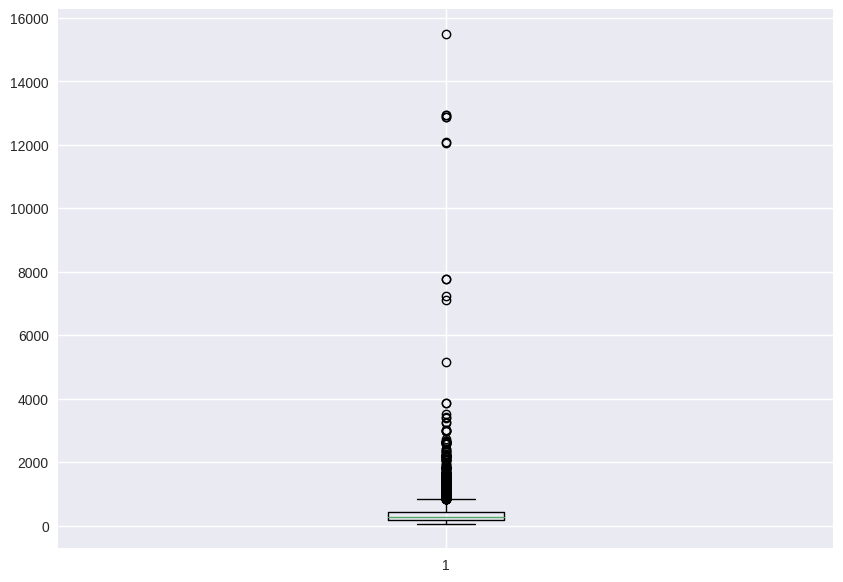

In [16]:
fig = plt.figure(figsize =(10, 7))
 
# Creating plot
plt.boxplot(data["realSum"])
 
# show plot
plt.show()

Из графика видно, что имеется большое количество выбросов в выборке. 

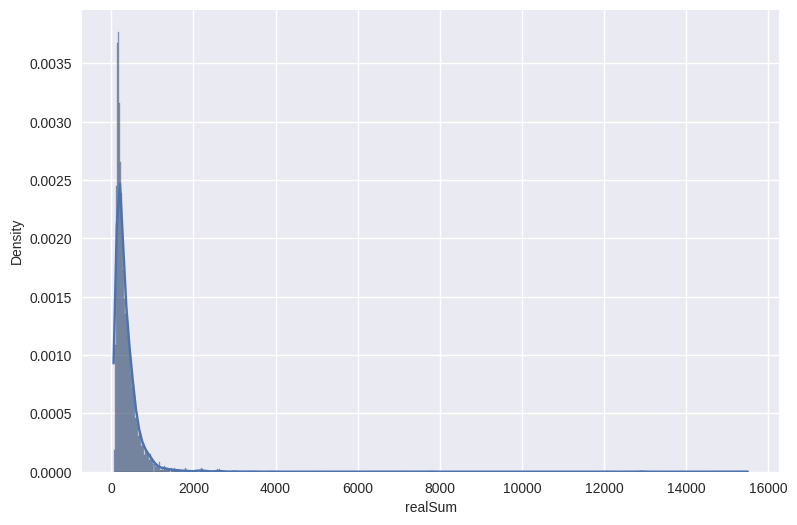

In [17]:
import seaborn as sns

plt.figure(figsize=(9, 6))
sns.histplot(data["realSum"], kde=True, stat="density", linewidth=0.1);

In [18]:
print(f'По realSum ср. знач. = {data["realSum"].describe()[1]}, медиана = {data["realSum"].describe()[5]}, мода = {data["realSum"].mode().values}.')


По realSum ср. знач. = 362.46925565299006, медиана = 261.2949505, мода = [142.2893295].


Поскольку соотношение выглядит следующим образом: $$M_o < M_e < X$$ то имеет место правосторонняя асимметрия, поэтому имеет смысл рассматривать логарифм стоимости. 

In [19]:
data['log_realSum'] = np.log(data['realSum'])

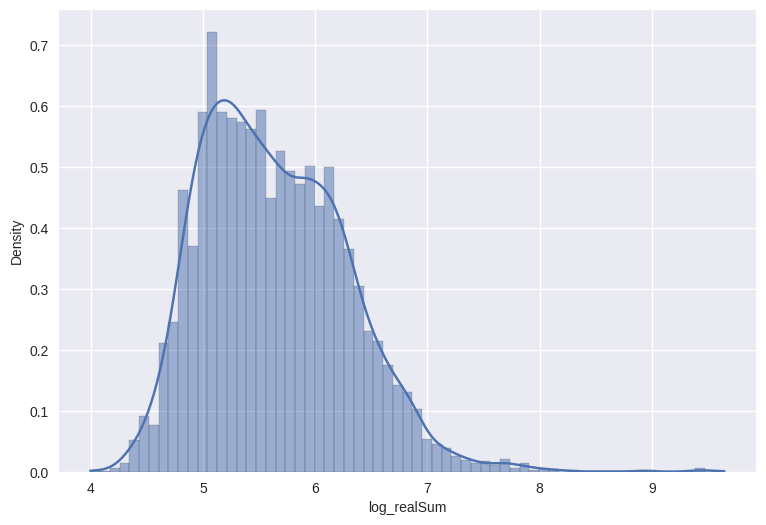

In [20]:
plt.figure(figsize=(9, 6))
sns.histplot(data["log_realSum"], kde=True, stat="density", linewidth=0.1);

Такое распределение стало ближе к нормальному. 

**room_shared**

In [21]:
data[['realSum', 'room_shared']].groupby(by = 'room_shared').describe()

realSum                                                 \
              count        mean         std        min         25%   
room_shared                                                          
0            9943.0  363.387733  472.313058  54.328653  170.276817   
1              50.0  179.820786   97.441214  56.680543  136.762389   

                                                   
                    50%         75%           max  
room_shared                                        
0            262.706084  438.157059  15499.894160  
1            155.107129  193.972107    579.976011

In [22]:
cut_counts = data['room_shared'].value_counts()
fig = px.bar(x=cut_counts.index, y=cut_counts.values, title='room_shared')
fig.show()

Во-первых, заметим, что большинство представленных в выборке апартаментов не являются общими (вида хостелов); средняя стоимость по двум типам таких апартаментов сильно различается (363.387733 евро для не общих апартаментов и 179.820786 евро для общих).

**room_private**

In [23]:
data[['realSum', 'room_private']].groupby(by = 'room_private').describe()

realSum                                                 \
               count        mean         std        min         25%   
room_private                                                          
0             4434.0  540.583396  524.500515  56.680543  334.497519   
1             5559.0  220.400881  366.757073  54.328653  142.289330   

                                                   
                     50%         75%          max  
room_private                                       
0             446.153484  608.022296  15499.89416  
1             180.389943  235.541758  12929.51386

In [24]:
cut_counts = data['room_private'].value_counts()
fig = px.bar(x=cut_counts.index, y=cut_counts.values, title='room_private')
fig.show()

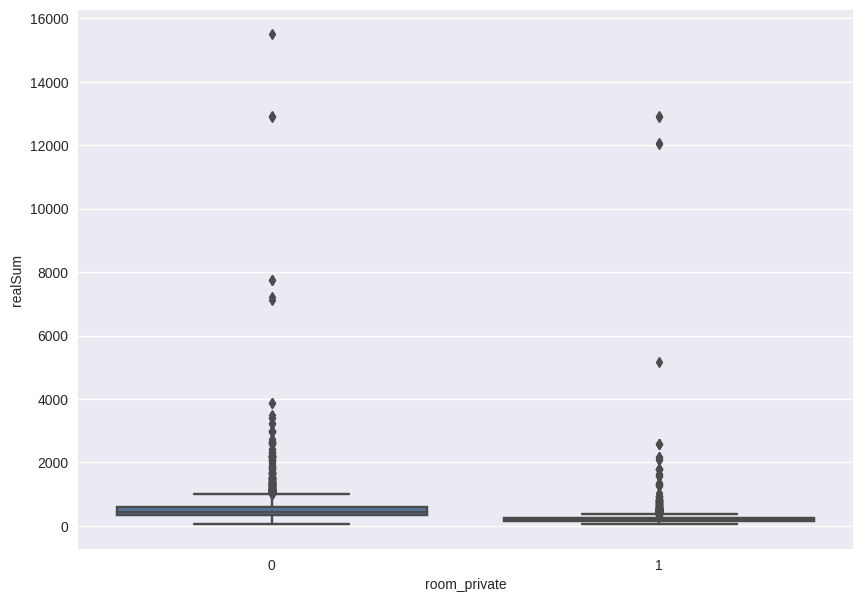

In [25]:
fig = plt.figure(figsize =(10, 7))
 
# Creating plot
sns.boxplot(y = data["realSum"], x = data["room_private"]);

Следовательно, для частных апартаментов цена в среднем выше (540.583396 евро против 220.400881). 

**host_is_superhost**

In [26]:
data[['realSum', 'host_is_superhost']].groupby(by = 'host_is_superhost').describe()

realSum                                                 \
                    count        mean         std        min         25%   
host_is_superhost                                                          
0                  8420.0  365.378641  455.828536  54.328653  170.041628   
1                  1573.0  346.895813  546.937812  56.680543  168.160117   

                                                        
                          50%         75%          max  
host_is_superhost                                       
0                  269.056187  448.505374  12937.27510  
1                  237.305675  374.891225  15499.89416

In [27]:
cut_counts = data['host_is_superhost'].value_counts()
fig = px.bar(x=cut_counts.index, y=cut_counts.values, title='host_is_superhost')
fig.show()

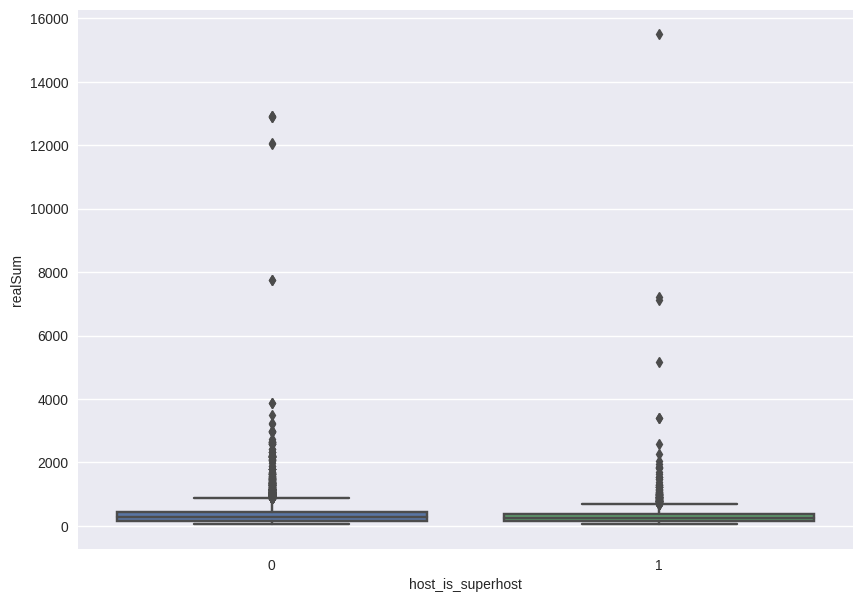

In [28]:
fig = plt.figure(figsize =(10, 7))
 
# Creating plot
sns.boxplot(y = data["realSum"], x = data["host_is_superhost"]);

По имеющейся выборке с немногочисленными апартаментами с суперхозяином можно сделать вывод, что средняя цена для таких апартаментов отличается слабо. 

**multi**

In [29]:
data[['realSum', 'multi']].groupby(by = 'multi').describe()

realSum                                                             \
        count        mean         std        min         25%         50%   
multi                                                                      
0      7245.0  375.848374  517.409458  54.328653  173.569463  271.878454   
1      2748.0  327.195706  316.959993  67.264047  162.985959  234.130624   

                                 
              75%           max  
multi                            
0      456.266610  15499.894160  
1      386.650674   3874.973541

In [30]:
cut_counts = data['multi'].value_counts()
fig = px.bar(x=cut_counts.index, y=cut_counts.values, title='multi')
fig.show()

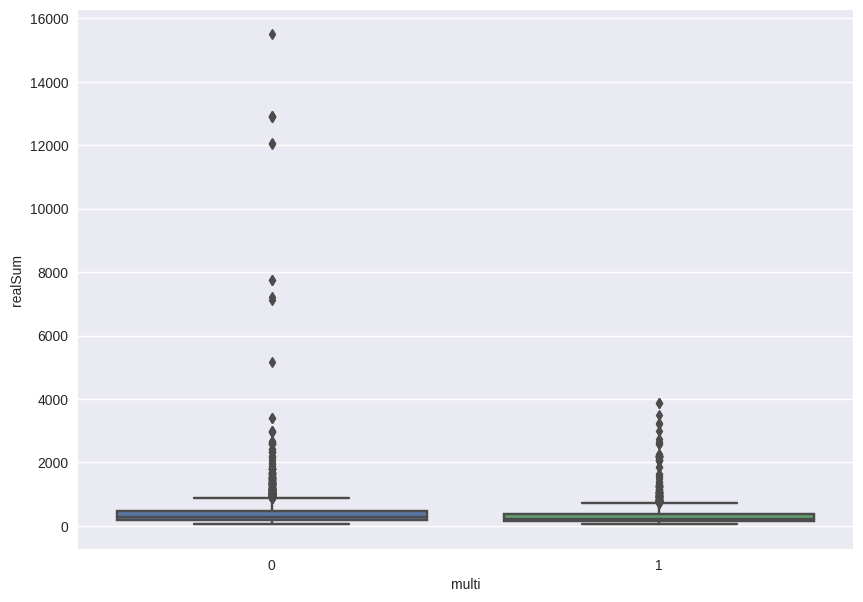

In [31]:
fig = plt.figure(figsize =(10, 7))
 
# Creating plot
sns.boxplot(y = data["realSum"], x = data["multi"]);

Различия в стоимости незначительны для апартаментов с хозяином с 2-4 другими предложениями и с одним предложением. 

**biz**

In [32]:
data[['realSum', 'biz']].groupby(by = 'biz').describe()

realSum                                                             \
      count        mean         std        min         25%         50%   
biz                                                                      
0    6117.0  332.482812  505.820562  54.328653  161.574825  235.659352   
1    3876.0  409.793063  406.721822  79.964251  191.149839  321.150544   

                              
            75%          max  
biz                           
0    386.415485  12937.27510  
1    517.415743  15499.89416

In [33]:
cut_counts = data['biz'].value_counts()
fig = px.bar(x=cut_counts.index, y=cut_counts.values, title='biz')
fig.show()

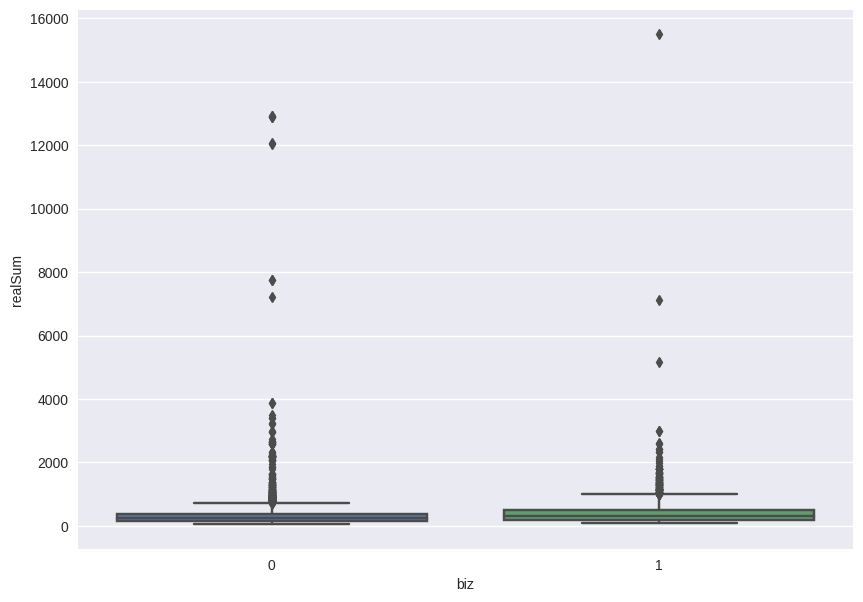

In [34]:
fig = plt.figure(figsize =(10, 7))
 
# Creating plot
sns.boxplot(y = data["realSum"], x = data["biz"]);

В ценах для апартаментов с хозяином, у которого более чем 4 предложения других апартаментов, и апартаментов с хозяином с меньшим количеством апартаментов есть небольшие различия в цене. 

**weekend**

In [35]:
data[['realSum', 'weekend']].groupby(by = 'weekend').describe()

realSum                                                             \
          count        mean         std        min         25%         50%   
weekend                                                                      
0        4614.0  360.230348  507.782888  64.676968  167.454550  256.355982   
1        5379.0  364.389747  437.742534  54.328653  174.510219  268.115431   

                                  
                75%          max  
weekend                           
0        435.452386  15499.89416  
1        438.274654  12937.27510

In [36]:
cut_counts = data['weekend'].value_counts()
fig = px.bar(x=cut_counts.index, y=cut_counts.values, title='weekend')
fig.show()

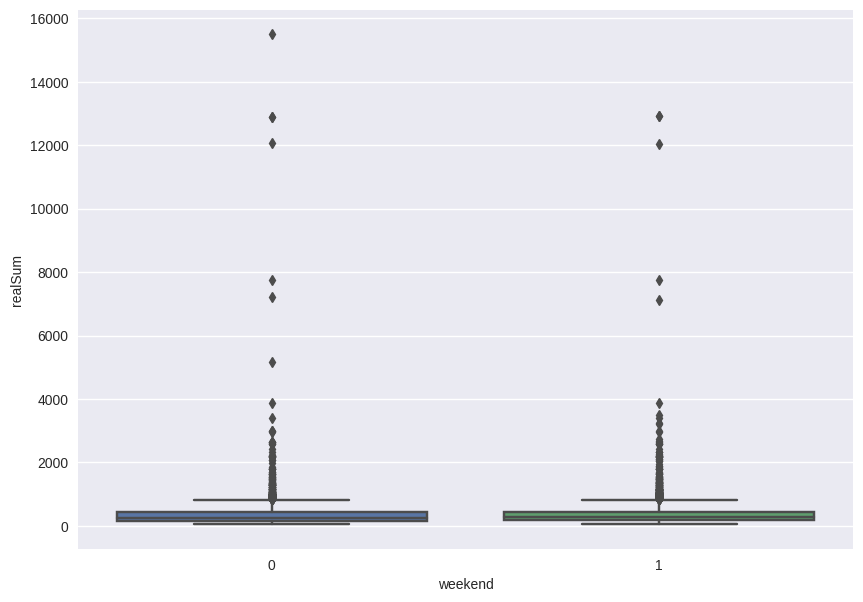

In [37]:
fig = plt.figure(figsize =(10, 7))
 
# Creating plot
sns.boxplot(y = data["realSum"], x = data["weekend"]);

Таким образом, цены для апартаментов в будние и выходные дни почти не отличаются. 

**room_type**

In [38]:
data[['realSum', 'room_type']].groupby(by = 'room_type').describe()

realSum                                                  \
                  count        mean         std         min         25%   
room_type                                                                 
Entire home/apt  4384.0  544.697933  525.957480  103.012771  336.320233   
Private room     5559.0  220.400881  366.757073   54.328653  142.289330   
Shared room        50.0  179.820786   97.441214   56.680543  136.762389   

                                                       
                        50%         75%           max  
room_type                                              
Entire home/apt  450.151697  611.608928  15499.894160  
Private room     180.389943  235.541758  12929.513860  
Shared room      155.107129  193.972107    579.976011

In [39]:
cut_counts = data['room_type'].value_counts()
fig = px.bar(x=cut_counts.index, y=cut_counts.values, title='room_type')
fig.show()

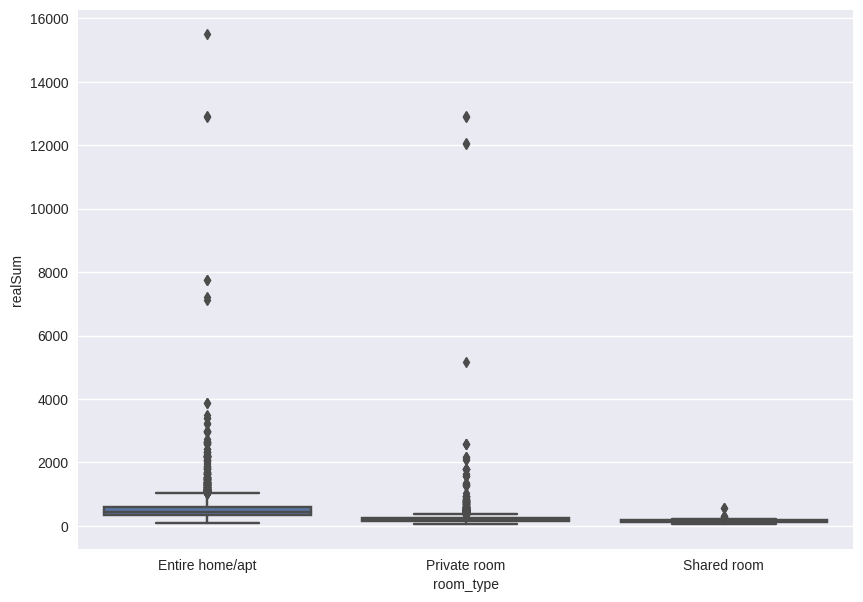

In [40]:
fig = plt.figure(figsize =(10, 7))
 
# Creating plot
sns.boxplot(y = data["realSum"], x = data["room_type"]);

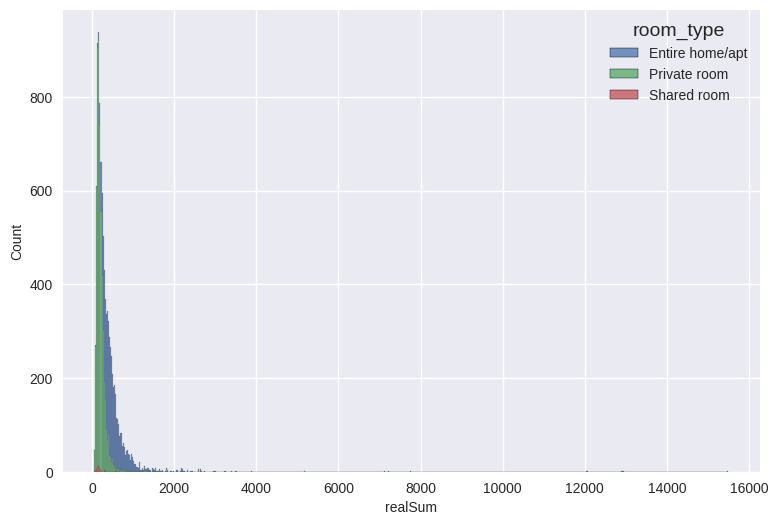

In [41]:
plt.figure(figsize=(9, 6))
sns.histplot(x='realSum',
        hue = 'room_type',
        data=data, multiple="stack");

Среди имеющихся апартаментов больше всего представлено апартаментов комнатного типа, затем в формате квартиры и меньше всего хостелов. Для каждого типа жилья средняя стоимость сильно отличается: для квартирного типа - 544.697933 евро, для комнаты - 220.400881 евро, для хостела - 179.820786 евро. 

**cleanliness_rating**

In [42]:
data[['realSum', 'cleanliness_rating']].groupby(by = 'cleanliness_rating').describe()

realSum                                                   \
                     count        mean          std         min         25%   
cleanliness_rating                                                            
2                     55.0  500.695946   509.298740  114.772220  203.203274   
3                      4.0  311.978174   154.639746  162.985959  186.269668   
4                     60.0  382.311437   189.419637   81.375385  207.142689   
5                     32.0  276.347045   145.390495   87.019921  184.505750   
6                    154.0  365.511156   340.948097   54.328653  158.399774   
7                    328.0  401.804588  1015.462450   69.851125  151.167713   
8                   1321.0  325.915302   500.650206   69.851125  150.050566   
9                   3014.0  336.739110   272.814392   56.680543  171.923140   
10                  5025.0  383.689727   505.780405   56.680543  177.097298   

                                                          
                           50%         75%           max  
cleanliness_rating                                        
2                   329.734942  543.404125   2632.235001  
3                   319.269033  444.977539    446.388673  
4                   413.932595  486.547191    773.301348  
5                   248.124368  368.835109    750.252828  
6                   294.809379  470.142760   2663.985512  
7                   248.359557  391.766034  12929.513860  
8                   242.009455  400.762012  12076.953830  
9                   258.825466  438.157059   7223.829347  
10                  267.880242  448.505374  15499.894160

In [43]:
cut_counts = data['cleanliness_rating'].value_counts()
fig = px.bar(x=cut_counts.index, y=cut_counts.values, title='cleanliness_rating')
fig.show()

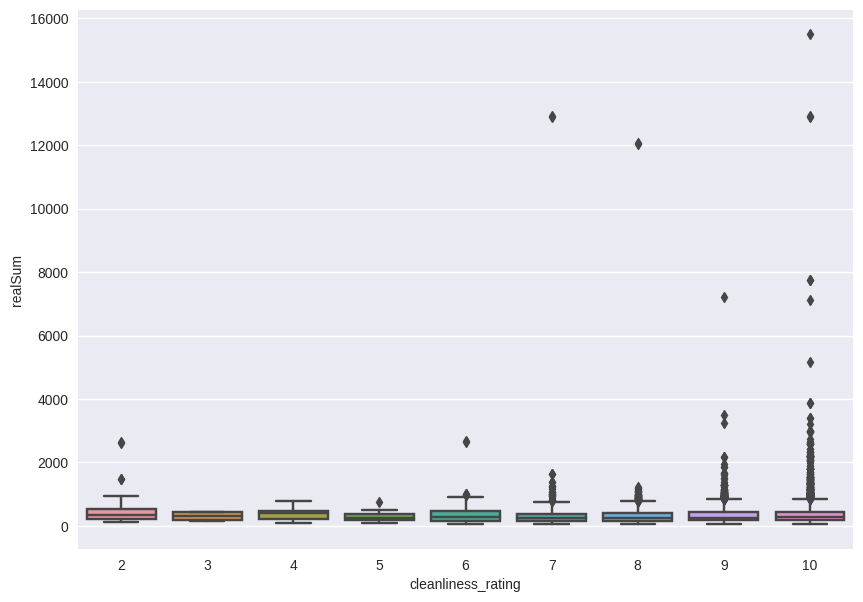

In [44]:
fig = plt.figure(figsize =(10, 7))
 
# Creating plot
sns.boxplot(y = data["realSum"], x = data["cleanliness_rating"]);

Исходя из полученных данных можно сделать вывод, что строгой зависимости цены от рейтинга чистоты не наблюдается, возможно, так происходит из-за неравномерного количества представленных апартаментов каждой категории рейтинга. 

**guest_satisfaction_overall**

In [45]:
data[['realSum', 'guest_satisfaction_overall']].groupby(by = 'guest_satisfaction_overall').describe()

realSum                                       \
                             count        mean          std         min   
guest_satisfaction_overall                                                
20                            64.0  493.749853   472.082150  103.012771   
30                             6.0  190.032691    43.840133  136.644794   
40                            56.0  443.713399   280.917595   72.203015   
46                             1.0  154.519156          NaN  154.519156   
47                             5.0  383.969519   127.054583  247.653990   
50                            15.0  302.845003   178.304016   87.019921   
53                             4.0  424.104518    87.809072  340.083257   
55                             2.0  491.074578    28.271632  471.083516   
57                             1.0  274.935911          NaN  274.935911   
60                           170.0  390.978151   203.151352   77.377173   
61                             1.0  113.596275          NaN  113.596275   
62                             2.0  124.062184    58.372605   82.786519   
63                            10.0  225.851972   139.667890   69.851125   
64                             4.0  283.873092   140.153949  103.012771   
65                            12.0  386.925061   201.837011  219.196124   
66                             2.0  523.060279   178.610194  396.763800   
67                            36.0  320.164057   238.817559   77.377173   
68                            11.0  399.757114   317.292470  113.361086   
69                            15.0  326.630448   225.074237   69.851125   
70                            88.0  348.841374   154.825769   77.377173   
71                            14.0  476.929642   299.430102  148.639432   
72                            29.0  611.896832   637.957901   80.199440   
73                            81.0  348.956559   227.964288   88.431054   
74                            36.0  331.714449   302.892926   82.786519   
75                            58.0  370.317205   193.763681   92.899645   
76                            53.0  315.383977   167.559930   95.721913   
77                            59.0  298.466767   179.877667   86.314354   
78                            73.0  261.681563   161.833920   79.964251   
79                            64.0  220.555810   140.990526   74.790094   
80                           600.0  410.856323   761.091126   74.790094   
81                            79.0  204.117236   104.357582   90.312566   
82                           117.0  265.572576   172.216471  105.835038   
83                           189.0  286.766290   191.541153   82.551330   
84                           157.0  263.916484   138.981867   92.664456   
85                           210.0  311.333085   205.826014   85.373598   
86                           162.0  283.630644   169.647894   90.312566   
87                           295.0  337.039353   244.676367   77.377173   
88                           250.0  358.329218   247.742279   82.551330   
89                           231.0  413.900015  1104.945365   73.614149   
90                           514.0  400.262350   298.394399   89.136621   
91                           289.0  303.025124   209.918636   64.441779   
92                           295.0  363.554319   324.676480   79.964251   
93                           544.0  362.066941   292.822651   56.680543   
94                           319.0  343.053716   238.215281   80.199440   
95                           490.0  362.033588   784.062347   86.314354   
96                           474.0  335.298600   251.936667  103.012771   
97                           476.0  351.279438   355.112603   82.786519   
98                           584.0  330.047453   414.285390   90.312566   
99                           365.0  298.687420   349.761084   75.025283   
100                         2381.0  410.062694   563.387512   54.328653   

                                                   

In [46]:
cut_counts = data['guest_satisfaction_overall'].value_counts()
fig = px.bar(x=cut_counts.index, y=cut_counts.values, title='guest_satisfaction_overall')
fig.show()

Строгой зависимости цены от рейтинга удовлетворенности гостя не наблюдается.

**person_capacity**

In [47]:
data['person_capacity'].describe(include="all")

count    9993.000000
mean        2.846192
std         1.246235
min         2.000000
25%         2.000000
50%         2.000000
75%         4.000000
max         6.000000
Name: person_capacity, dtype: float64

In [48]:
print(f'Размах: {data["person_capacity"].describe()[-1] - data["person_capacity"].describe()[3]}.')


Размах: 4.0.


In [49]:
print(f'Межквартильный размах: {data["person_capacity"].describe()[-2] - data["person_capacity"].describe()[4]}.')


Межквартильный размах: 2.0.


In [50]:
print(f'По person_capacity ср. знач. = {data["person_capacity"].describe()[1]}, медиана = {data["person_capacity"].describe()[5]}, мода = {data["person_capacity"].mode().values}.')



По person_capacity ср. знач. = 2.846192334634244, медиана = 2.0, мода = [2].


Таким образом, минимальное возможное количество размещаемых человек в апартаментах составляет 2 человека, максимальное - 6 человек, среднее значение - примерно 2.846192 человек, стандартное отклонение равно примерно 1.246235 человек, размах - 4 человека.

Квартильный анализ: 25% апартаментов вмещают не более 2 человек, 50% - также не более 2 человек, 75% - не более 4 человек. Межквартильный размах составляет 2 человека.

**bedrooms**

In [51]:
data['bedrooms'].describe(include="all")

count    9993.000000
mean        1.128790
std         0.579477
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         8.000000
Name: bedrooms, dtype: float64

In [52]:
print(f'Размах: {data["bedrooms"].describe()[-1] - data["bedrooms"].describe()[3]}.')

Размах: 8.0.


In [53]:
print(f'Межквартильный размах: {data["bedrooms"].describe()[-2] - data["bedrooms"].describe()[4]}.')


Межквартильный размах: 0.0.


Таким образом, минимальное возможное количество спален в апартаментах составляет 0 (студии), максимальное - 8 спален, среднее значение - примерно 1.12879 спален, стандартное отклонение равно примерно 0.579477 спален, размах - 8 спален. 

Квартильный анализ: 25% апартаментов имеют не более 1 спальни, 50% и 75% - также не более 1 спальни. Межквартильный размах составляет 0 спален.

**metro_dist**

In [54]:
data['metro_dist'].describe(include="all")

count    9993.000000
mean        1.005547
std         1.263926
min         0.013875
25%         0.320943
50%         0.530815
75%         1.070676
max         9.286229
Name: metro_dist, dtype: float64

In [55]:
print(f'Размах: {data["metro_dist"].describe()[-1] - data["metro_dist"].describe()[3]}.')


Размах: 9.272354842.


In [56]:
print(f'Межквартильный размах: {data["metro_dist"].describe()[-2] - data["metro_dist"].describe()[4]}.')


Межквартильный размах: 0.7497329810000001.


Таким образом, минимальное расстояния от ближайшей станции метро до апартаментов составляет 0.013875 км, максимальное расстояние - 9.286229 км, среднее значение - примерно 1.005547 км, стандартное отклонение равно примерно 1.263926 км, размах - 9.272354842 км. 

Квартильный анализ: 25% апартаментов находятся на расстоянии до 0.320943 км до ближайшей станции метро, 50% - до 0.530815 км, 75% - 1.070676 до км. Межквартильный размах составляет 0.749732981 км.

**attr_index**

In [57]:
data['attr_index'].describe(include="all")

count    9993.000000
mean      295.448532
std       171.401698
min        68.740487
25%       177.577991
50%       249.276621
75%       361.410786
max      1438.618956
Name: attr_index, dtype: float64

In [58]:
print(f'Размах: {data["attr_index"].describe()[-1] - data["attr_index"].describe()[3]}.')


Размах: 1369.87846908.


In [59]:
print(f'Межквартильный размах: {data["attr_index"].describe()[-2] - data["attr_index"].describe()[4]}.')


Межквартильный размах: 183.8327956.


Таким образом, минимум индекса привлекательности местоположения апартаментов составляет 68.740487, максимум - 1438.618956, среднее значение - примерно 295.448532, стандартное отклонение равно примерно 171.401698, размах - 1369.87846908.

Квартильный анализ: 25% апартаментов имеют индекс привлекательности местоположения апартаментов до 177.577991, 50% - до 249.276621, 75% - до 361.410786. Межквартильный размах составляет 183.8327956.

**attr_index_norm**

In [60]:
data['attr_index_norm'].describe(include="all")

count    9993.000000
mean       20.537398
std        11.914575
min         4.778228
25%        12.344088
50%        17.327889
75%        25.122161
max       100.000000
Name: attr_index_norm, dtype: float64

In [61]:
print(f'Размах: {data["attr_index_norm"].describe()[-1] - data["attr_index_norm"].describe()[3]}.')


Размах: 95.221772475.


In [62]:
print(f'Межквартильный размах: {data["attr_index_norm"].describe()[-2] - data["attr_index_norm"].describe()[4]}.')


Межквартильный размах: 12.77807238.


Таким образом, минимум нормализованного индекса привлекательности местоположения апартаментов составляет 4.778228, максимум - 100, среднее значение - примерно 20.537398, стандартное отклонение равно примерно 11.914575, размах - 95.221772475.

Квартильный анализ: 25% апартаментов имеют нормализованный индекс привлекательности местоположения апартаментов до 12.344088, 50% - до 17.327889, 75% - до 25.122161. Межквартильный размах составляет 12.77807238.

**rest_index**

In [63]:
data['rest_index'].describe(include="all")

count    9993.000000
mean      627.541611
std       389.000019
min       140.521722
25%       383.553180
50%       528.626061
75%       770.026639
max      5587.136047
Name: rest_index, dtype: float64

In [64]:
print(f'Размах: {data["rest_index"].describe()[-1] - data["rest_index"].describe()[3]}.')


Размах: 5446.6143247.


In [65]:
print(f'Межквартильный размах: {data["rest_index"].describe()[-2] - data["rest_index"].describe()[4]}.')


Межквартильный размах: 386.4734592.


Таким образом, минимум ресторанного индекса апартаментов составляет 140.521722, максимум - 5587.136047, среднее значение - примерно 627.541611, стандартное отклонение равно примерно 389.000019, размах - 5446.6143247.

Квартильный анализ: 25% апартаментов имеют ресторанный индекс апартаментов до 383.55318, 50% - до 528.626061, 75% - до 770.026639. Межквартильный размах составляет 386.4734592.

**rest_index_norm**

In [66]:
data['rest_index_norm'].describe(include="all")

count    9993.000000
mean       11.234105
std         6.963803
min         2.515094
25%         6.864961
50%         9.465474
75%        13.783694
max       100.000000
Name: rest_index_norm, dtype: float64

In [67]:
print(f'Размах: {data["rest_index_norm"].describe()[-1] - data["rest_index_norm"].describe()[3]}.')


Размах: 97.484906021.


In [68]:
print(f'Межквартильный размах: {data["rest_index_norm"].describe()[-2] - data["rest_index_norm"].describe()[4]}.')


Межквартильный размах: 6.918733165.


Таким образом, минимум нормализованного ресторанного индекса апартаментов составляет 2.515094, максимум - 100, среднее значение - примерно 11.234105, стандартное отклонение равно примерно 6.963803, размах - 97.484906021.

Квартильный анализ: 25% апартаментов имеют нормализованный ресторанный индекс апартаментов до 6.864961, 50% - до 9.465474, 75% - до 13.783694. Межквартильный размах составляет 6.918733165.

**lng**

In [69]:
data['lng'].describe(include="all")

count    9993.000000
mean       -0.114830
std         0.067824
min        -0.251700
25%        -0.170680
50%        -0.118180
75%        -0.067600
max         0.120180
Name: lng, dtype: float64

In [70]:
print(f'Размах: {data["lng"].describe()[-1] - data["lng"].describe()[3]}.')


Размах: 0.37188.


In [71]:
print(f'Межквартильный размах: {data["lng"].describe()[-2] - data["lng"].describe()[4]}.')


Межквартильный размах: 0.10308.


Таким образом, минимум долготы местоположения апартаментов составляет -0.251700, максимум - 0.120180, среднее значение - примерно -0.114830, стандартное отклонение равно примерно 0.067824, размах - 0.37188.

Квартильный анализ: 25% апартаментов имеют долготу местоположения апартаментов до -0.170680, 50% - до -0.118180, 75% - до -0.067600. Межквартильный размах составляет 0.10308.

**lat**

In [72]:
data['lat'].describe(include="all")

count    9993.000000
mean       51.503367
std         0.031734
min        51.414400
25%        51.486000
50%        51.509710
75%        51.525160
max        51.575820
Name: lat, dtype: float64

In [73]:
print(f'Размах: {data["lat"].describe()[-1] - data["lat"].describe()[3]}.')


Размах: 0.16141999999999967.


In [74]:
print(f'Межквартильный размах: {data["lat"].describe()[-2] - data["lat"].describe()[4]}.')


Межквартильный размах: 0.039160000000002526.


Таким образом, минимум широты местоположения апартаментов составляет 51.414400, максимум - 51.575820, среднее значение - примерно 51.503367, стандартное отклонение равно примерно 0.031734, размах - 0.16141999999999967.

Квартильный анализ: 25% апартаментов имеют широту местоположения апартаментов до 51.486000, 50% - до 51.509710, 75% - до 51.525160. Межквартильный размах составляет 0.039160000000002526.

**dist**

Добавим новую переменную: представление расстояния относительно точки с нулевыми долготой и широтой

In [75]:
def combine_lat_long(lng, lat):
    latitude = np.radians(lat)
    longitude = np.radians(lng)

    london_latitude = np.radians(0)
    london_longitude = np.radians(0)

    # apply Haversine formula to compute distance
    latitude_distance = london_latitude - latitude
    longitude_distance = london_longitude - longitude
    a = np.sin(latitude_distance/2)**2 + np.cos(latitude) * np.cos(london_latitude) * np.sin(longitude_distance/2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    distance = 6371 * c

    return distance

In [76]:
data['dist'] = combine_lat_long(data['lng'], data['lat'])

In [77]:
numerical_features.append('dist')

In [78]:
data['dist'].describe(include="all")

count    9993.000000
mean     5726.926875
std         3.527072
min      5717.020577
25%      5724.991899
50%      5727.639659
75%      5729.347919
max      5734.972601
Name: dist, dtype: float64

In [79]:
print(f'Размах: {data["dist"].describe()[-1] - data["dist"].describe()[3]}.')

Размах: 17.952024069984873.


In [80]:
print(f'Межквартильный размах: {data["dist"].describe()[-2] - data["dist"].describe()[4]}.')


Межквартильный размах: 4.356019757458853.


Таким образом, минимальное расстояния от нулевой точки до апартаментов составляет 5717.020577, максимальное расстояние - 5734.97260, среднее значение - примерно 5726.926875, стандартное отклонение равно примерно 3.527072, размах - 17.952024069984873.

Квартильный анализ: 25% апартаментов находятся на расстоянии до 5724.991899 до нулевой точки, 50% - до 5727.639659, 75% - до 5729.347919. Межквартильный размах составляет 4.356019757458853.

#### Графическое представление категориальных переменных и дамми-переменных, их численность и соотношение со стоимостью  

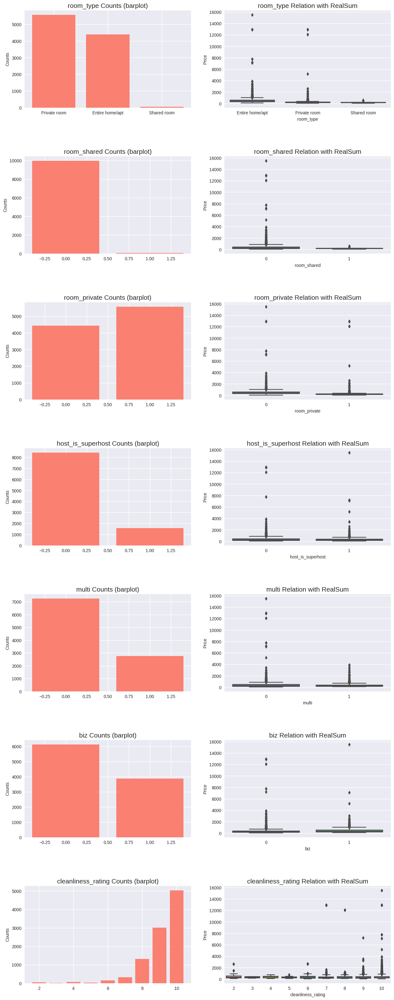

In [81]:
def plotter_5(feature,color,row):
    axes[row,0].bar(x = list(data[feature].value_counts().index), height=list(data[feature].value_counts().values), color=color)
    axes[row,0].set_ylabel("Counts")
    axes[row,0].set_title(str(feature)+" Counts (barplot)")
    axes[row,0].title.set_size(15)
    
    sns.boxplot(data=data, x = feature, y = 'realSum', ax=axes[row,1])
    axes[row,1].set_ylabel("Price")
    axes[row,1].set_title(str(feature)+" Relation with RealSum")
    axes[row,1].title.set_size(15)

    
plt.figure
fig, axes = plt.subplots(nrows=7, ncols=2, figsize=(15, 40))

for i in range(7):
    plotter_5(categorical_features[i] , '#FA8072' , i)

plt.subplots_adjust(hspace=0.50)
plt.show()

На данных графиках и графиках выше можно заметить, что практически для каждой категориальной переменной и дамми-переменной наблюдаются различия в величинах стоимости апартаментов, поэтому они также будут включены в функциональную форму. 

#### Диаграмма рассеяния для числовых параметров и тренд для realSum

<ipython-input-82-f581b513546b>:5: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "r--" (-> color='r'). The keyword argument will take precedence.



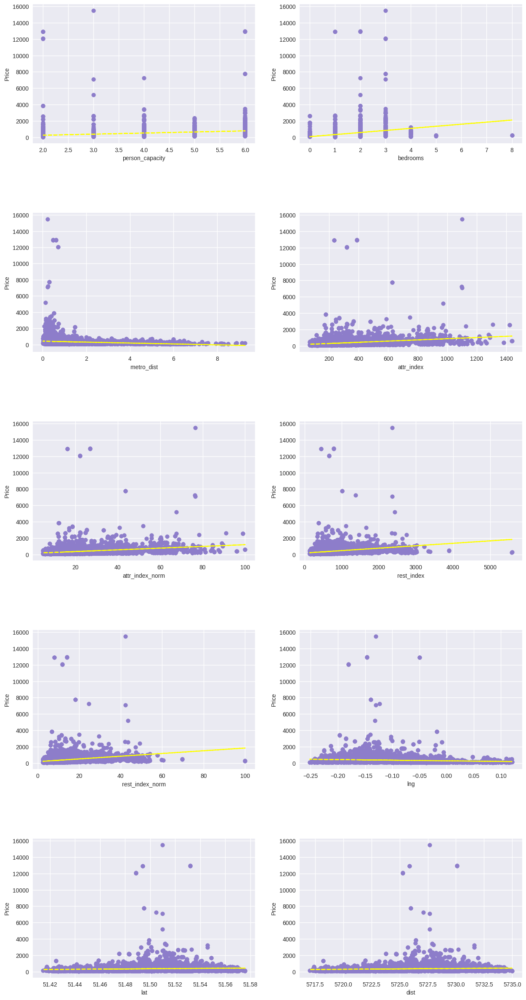

In [82]:
def plotter_4(feature,color,x,y):
        
    axes[x,y].scatter(y=data["realSum"], x=data[feature],c=color)
    trend_line = np.poly1d(np.polyfit(data[feature], data["realSum"], 1))
    axes[x,y].plot(data[feature], trend_line(data[feature]), "r--",c='yellow')
    axes[x,y].set_ylabel("Price")
    axes[x,y].set_xlabel(feature)

fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15, 30))
x = 0
y = 0
for i in range(10):
    plotter_4(numerical_features[i] , '#8d7dca', x, y)
    y  = y + 1
    if y == 2:
        x = x + 1
        y = 0

plt.subplots_adjust(hspace=0.5)

Из графика выше можно заметить нелинейную зависимость между metro_dist и dist с объясняемой переменной, у остальных признаков наблюдается линейная зависимость. 

## **Функциональные формы**

In [83]:
ols_lin = smf.ols('realSum ~ room_shared + room_private + person_capacity + host_is_superhost + multi + biz + cleanliness_rating + guest_satisfaction_overall + bedrooms + dist + metro_dist + attr_index_norm + rest_index_norm + weekend',
                data=data).fit()
print(ols_lin.summary()) #Линейная модель

                            OLS Regression Results                            
Dep. Variable:                realSum   R-squared:                       0.231
Model:                            OLS   Adj. R-squared:                  0.230
Method:                 Least Squares   F-statistic:                     213.9
Date:                Wed, 10 May 2023   Prob (F-statistic):               0.00
Time:                        13:42:21   Log-Likelihood:                -74381.
No. Observations:                9993   AIC:                         1.488e+05
Df Residuals:                    9978   BIC:                         1.489e+05
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept           

Удалим незначимые коэффициенты при host_is_superhost, multi, biz, cleanliness_rating, guest_satisfaction_overall, weekend, rest_index_norm.

In [84]:
ols_2 = smf.ols('realSum ~ room_shared + room_private + person_capacity + bedrooms + dist + metro_dist + attr_index_norm',
                data=data).fit()
print(ols_2.summary()) #Линейная модель

                            OLS Regression Results                            
Dep. Variable:                realSum   R-squared:                       0.229
Model:                            OLS   Adj. R-squared:                  0.228
Method:                 Least Squares   F-statistic:                     423.5
Date:                Wed, 10 May 2023   Prob (F-statistic):               0.00
Time:                        13:42:21   Log-Likelihood:                -74393.
No. Observations:                9993   AIC:                         1.488e+05
Df Residuals:                    9985   BIC:                         1.489e+05
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept        1.785e+04   7377.061     

Модель не очень хорошая. Добавим логарифм реальной цены и построим полулогарифмическую модель.

In [85]:
ols_polulog = smf.ols('log_realSum ~ room_shared + room_private + person_capacity + host_is_superhost + multi + biz + cleanliness_rating + guest_satisfaction_overall + bedrooms + dist + metro_dist + attr_index_norm + rest_index_norm + weekend',
                data=data).fit()
print(ols_polulog.summary()) #Полулогарифмическая модель

                            OLS Regression Results                            
Dep. Variable:            log_realSum   R-squared:                       0.676
Model:                            OLS   Adj. R-squared:                  0.675
Method:                 Least Squares   F-statistic:                     1485.
Date:                Wed, 10 May 2023   Prob (F-statistic):               0.00
Time:                        13:42:21   Log-Likelihood:                -4205.7
No. Observations:                9993   AIC:                             8441.
Df Residuals:                    9978   BIC:                             8550.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept           

Коэффициенты при weekend, biz и guest_satisfaction_overall незначимы на уровне значимости 5%. Уберем их из модели.

In [86]:
ols_3 = smf.ols('log_realSum ~ room_shared + room_private + person_capacity + host_is_superhost + multi + cleanliness_rating + bedrooms + dist + metro_dist + attr_index_norm + rest_index_norm',
                data=data).fit()
print(ols_3.summary()) #Полулогарифмическая модель

                            OLS Regression Results                            
Dep. Variable:            log_realSum   R-squared:                       0.676
Model:                            OLS   Adj. R-squared:                  0.675
Method:                 Least Squares   F-statistic:                     1890.
Date:                Wed, 10 May 2023   Prob (F-statistic):               0.00
Time:                        13:42:21   Log-Likelihood:                -4208.3
No. Observations:                9993   AIC:                             8441.
Df Residuals:                    9981   BIC:                             8527.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept             19.6746      6

Для выбора между двумя функциональными формами будем проводить P/E тест, но до этого избавимся от выбросов.


# Выбросы

1 способ: boxplot

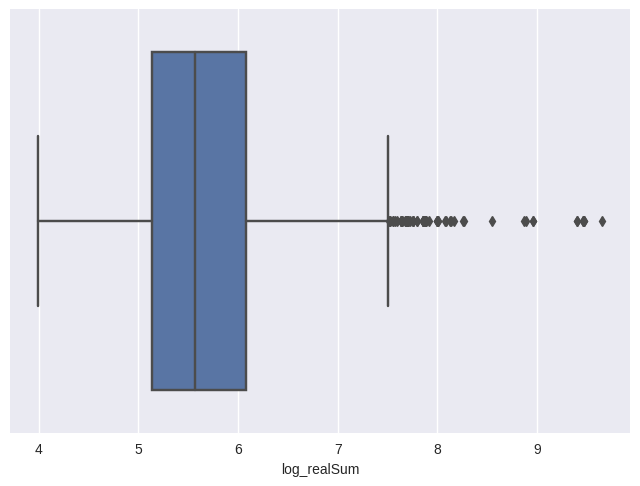

In [87]:
sns.boxplot(x=data['log_realSum']); #boxplot для размера зарплаты

In [88]:
print(np.where(data['log_realSum'] > 7.5))

(array([  25,   55,  108,  154,  517,  536,  556,  568,  612,  740, 1028,
       1378, 1645, 1676, 1801, 1841, 1842, 1886, 1891, 2296, 2548, 3167,
       3458, 3483, 3532, 3534, 3679, 3770, 3953, 4050, 4122, 4211, 4312,
       4416, 4464, 4734, 4756, 4827, 4973, 5176, 5242, 5274, 5437, 5439,
       5445, 5448, 5456, 5799, 5812, 5861, 6031, 6117, 6928, 7054, 7250,
       7374, 7503, 7522, 7951, 8164, 8192, 8288, 8367, 8581, 8622, 8633,
       8637, 8723, 8867, 8983, 9049, 9063, 9173, 9353, 9582, 9591, 9619,
       9622, 9963]),)


2 способ: диаграмма рассеяния (была показана выше, на ней видный выбросы)

Способ 3: Z-оценка

In [89]:
z = np.abs(stats.zscore(data['log_realSum']))
print(np.where(z > 3)) #номера выбросов

(array([  25,   55,  108,  154,  517,  536,  556,  568,  740, 1378, 1645,
       1676, 1801, 1886, 1891, 2296, 2548, 3167, 3458, 3483, 3532, 3534,
       3679, 3770, 3953, 4050, 4122, 4211, 4312, 4416, 4464, 4756, 4827,
       4973, 5176, 5242, 5274, 5439, 5448, 5799, 5812, 5861, 6031, 6117,
       6928, 7054, 7250, 7503, 7522, 7951, 8164, 8192, 8288, 8367, 8581,
       8622, 8633, 8637, 8723, 8867, 8983, 9049, 9063, 9173, 9353, 9591,
       9619, 9622, 9963]),)


Способ 4: Межквартильный диапазон

In [90]:
Q1 = np.percentile(data['log_realSum'], 25,
                   interpolation = 'midpoint')
 
Q3 = np.percentile(data['log_realSum'], 75,
                   interpolation = 'midpoint')
IQR = Q3 - Q1

# Above Upper bound
u_bound = Q3+1.5*IQR
upper = data['log_realSum'] >= u_bound
 
print("Upper bound:",u_bound)
print(np.where(upper))
 
# Below Lower bound
l_bound = Q1-1.5*IQR
lower = data['log_realSum'] <= l_bound
print("Lower bound:", l_bound)
print(np.where(lower))

Upper bound: 7.506533778732487
(array([  25,   55,  108,  154,  517,  536,  556,  568,  740, 1028, 1378,
       1645, 1676, 1801, 1886, 1891, 2296, 2548, 3167, 3458, 3483, 3532,
       3534, 3679, 3770, 3953, 4050, 4122, 4211, 4312, 4416, 4464, 4734,
       4756, 4827, 4973, 5176, 5242, 5274, 5437, 5439, 5445, 5448, 5456,
       5799, 5812, 5861, 6031, 6117, 6928, 7054, 7250, 7503, 7522, 7951,
       8164, 8192, 8288, 8367, 8581, 8622, 8633, 8637, 8723, 8867, 8983,
       9049, 9063, 9173, 9353, 9582, 9591, 9619, 9622, 9963]),)
Lower bound: 3.7093168454444028
(array([], dtype=int64),)


<ipython-input-90-c7212ac235fc>:1: DeprecationWarning:

the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they. (Deprecated NumPy 1.22)

<ipython-input-90-c7212ac235fc>:4: DeprecationWarning:

the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they. (Deprecated NumPy 1.22)



Способ 5: Стьюдентизированные остатки

In [91]:
influence = ols_3.get_influence()
inf_sum = influence.summary_frame()

results = pd.concat([data, inf_sum], axis = 1) # Объединим исходные данные с таблицей показателей

In [92]:
student_resid = influence.resid_studentized_external

In [93]:
# определим критическое значение для стьюдентизированных остатков

crit = stats.t(df=9981).ppf((0.95))
print(crit)

1.6450063081906359


In [94]:
# Выведем номера всех возможных выбросов согласно стьюдентизированным остаткам

high_stud_res = pd.DataFrame((results[abs(student_resid) > crit]))
high_stud_res

,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,weekend,log_realSum,dfb_Intercept,dfb_room_shared,dfb_room_private,dfb_person_capacity,dfb_host_is_superhost,dfb_multi,dfb_cleanliness_rating,dfb_bedrooms,dfb_dist,dfb_metro_dist,dfb_attr_index_norm,dfb_rest_index_norm,cooks_d,standard_resid,hat_diag,dffits_internal,student_resid,dffits
16,310.919824,Private room,0,1,2,0,0,0,9,93,1,5723.306600,1.754002,216.528566,15.051141,468.625214,8.391125,-0.17501,51.47072,0,5.739535,0.014181,-0.000717,0.010199,-0.004087,-0.007391,-0.012049,-0.001992,0.001951,-0.014162,0.001830,-0.003622,0.003083,0.000088,1.709387,0.000360,0.032425,1.709551,0.032428
25,2173.851690,Entire home/apt,0,0,6,0,1,0,10,93,3,5724.715100,0.686639,264.740473,18.402404,566.772524,10.148535,-0.18580,51.48336,0,7.684256,0.021479,-0.000124,-0.004268,0.019130,-0.020035,0.044080,0.019895,0.053291,-0.021652,-0.021232,-0.007710,0.003081,0.000952,2.601131,0.001685,0.106869,2.601882,0.106900
48,121.827889,Private room,0,1,2,0,0,1,9,93,4,5726.347564,0.195613,335.383530,23.312881,574.093829,10.279629,-0.06669,51.49825,0,4.802609,-0.007357,-0.000594,0.004495,0.118177,0.018644,0.023198,0.017848,-0.198446,0.007280,0.034998,-0.015049,0.014425,0.003565,-2.961439,0.004854,-0.206821,-2.962592,-0.206902
52,431.336579,Private room,0,1,2,0,1,0,10,100,1,5730.672079,0.787053,333.615309,23.189970,746.338373,13.363811,-0.12140,51.53707,0,6.066889,-0.022415,0.000422,0.011583,-0.005591,-0.017454,0.032495,0.015665,0.001967,0.022344,0.003073,-0.001428,0.004484,0.000230,1.986072,0.000699,0.052542,1.986365,0.052549
55,2180.436981,Entire home/apt,0,0,6,0,1,0,9,97,3,5724.677406,0.645957,266.260291,18.508048,560.100047,10.029059,-0.18619,51.48302,0,7.687281,0.023394,-0.000600,-0.005341,0.017581,-0.015731,0.046320,-0.003324,0.057278,-0.023464,-0.022509,-0.006248,0.001233,0.000996,2.701439,0.001635,0.109319,2.702291,0.109354
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9961,873.491851,Entire home/apt,0,0,3,0,0,1,10,85,1,5727.907713,0.459496,397.923250,27.661197,721.114547,12.906694,-0.06752,51.51228,1,6.772499,-0.002301,-0.003213,-0.018984,-0.005735,-0.007294,-0.007251,0.014452,-0.003571,0.002276,-0.001358,0.014633,-0.013552,0.000112,1.742174,0.000441,0.036582,1.742352,0.036586
9963,2328.841224,Entire home/apt,0,0,6,0,0,0,10,100,3,5728.231808,0.424553,312.482429,21.721872,641.926607,11.489368,-0.06155,51.51520,1,7.753126,-0.004962,0.000670,0.003321,0.019931,-0.012842,-0.015628,0.022783,0.057789,0.004783,-0.014022,-0.000446,-0.004543,0.000842,2.716493,0.001367,0.100512,2.717362,0.100544
9965,368.776312,Private room,0,1,2,0,1,0,10,80,1,5726.241856,0.355446,173.810036,12.082213,418.978155,7.498979,-0.22779,51.49697,1,5.910190,0.006079,0.000644,0.009388,-0.003840,-0.016976,0.029832,0.014507,0.001649,-0.006117,-0.020544,-0.012659,0.005842,0.000199,1.863800,0.000686,0.048830,1.864031,0.048836
9982,1213.575108,Entire home/apt,0,0,5,0,0,1,10,100,2,5728.404696,0.402588,342.800397,23.829392,739.860266,13.242210,-0.06696,51.51675,1,7.101326,-0.003150,-0.000569,-0.002749,0.012835,-0.007214,-0.008255,0.014965,0.010758,0.003065,-0.005188,-0.001097,0.000019,0.000133,1.658220,0.000580,0.039961,1.658366,0.039965


In [95]:
data.drop(np.where(upper)[0], inplace = True)

In [96]:
data.shape

(9918, 21)

## Диаграмма рассеяния после удаления выбросов

<ipython-input-97-f581b513546b>:5: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "r--" (-> color='r'). The keyword argument will take precedence.



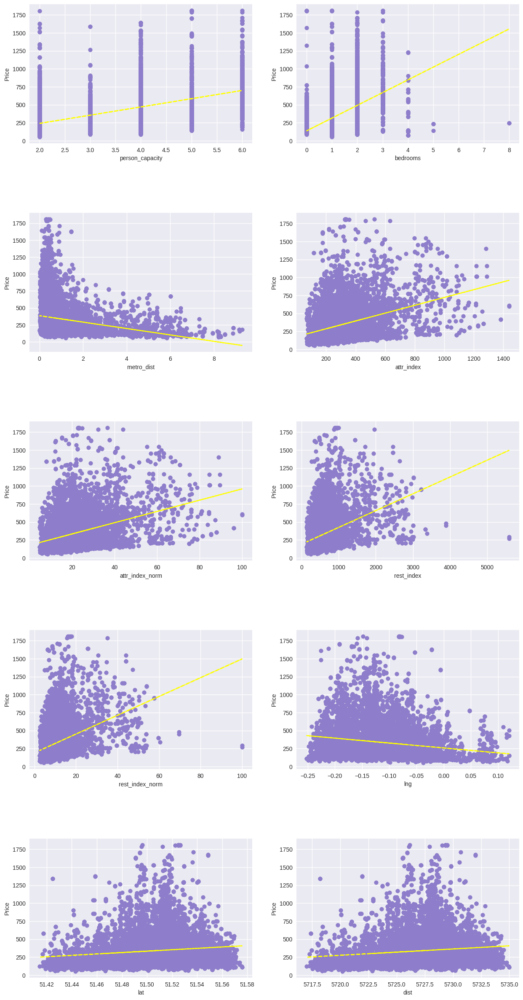

In [97]:
def plotter_4(feature,color,x,y):
        
    axes[x,y].scatter(y=data["realSum"], x=data[feature],c=color)
    trend_line = np.poly1d(np.polyfit(data[feature], data["realSum"], 1))
    axes[x,y].plot(data[feature], trend_line(data[feature]), "r--",c='yellow')
    axes[x,y].set_ylabel("Price")
    axes[x,y].set_xlabel(feature)

fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15, 30))
x = 0
y = 0
for i in range(10):
    plotter_4(numerical_features[i] , '#8d7dca', x, y)
    y  = y + 1
    if y == 2:
        x = x + 1
        y = 0

plt.subplots_adjust(hspace=0.5)

# Построение моделей без выбросов



### P/E тест для выбора между линейной и полулогарифмической моделью

Мы удалили выбросы. Так как линейная и полулогарифмическая модели имеют разный масштаб, будем сравнивать их с помощью P/E теста. Для этого построим две модели на очищенной выборке. Сразу уберем незначимые регрессоры.

In [98]:
ols_lin_clean = smf.ols('realSum ~ room_shared + room_private + person_capacity + host_is_superhost + biz + cleanliness_rating + bedrooms + dist + metro_dist + attr_index_norm + rest_index_norm',
                data=data).fit()
print(ols_lin_clean.summary()) #Линейная модель

                            OLS Regression Results                            
Dep. Variable:                realSum   R-squared:                       0.596
Model:                            OLS   Adj. R-squared:                  0.596
Method:                 Least Squares   F-statistic:                     1329.
Date:                Wed, 10 May 2023   Prob (F-statistic):               0.00
Time:                        13:43:55   Log-Likelihood:                -63865.
No. Observations:                9918   AIC:                         1.278e+05
Df Residuals:                    9906   BIC:                         1.278e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept            1.12e+04   2719

In [99]:
ols_polulog_clean = smf.ols('log_realSum ~ room_shared + room_private + person_capacity + host_is_superhost + multi + cleanliness_rating + bedrooms + metro_dist + attr_index_norm + rest_index_norm',
                data=data).fit()
print(ols_polulog_clean.summary()) #Полулогарифмическая модель

                            OLS Regression Results                            
Dep. Variable:            log_realSum   R-squared:                       0.697
Model:                            OLS   Adj. R-squared:                  0.696
Method:                 Least Squares   F-statistic:                     2275.
Date:                Wed, 10 May 2023   Prob (F-statistic):               0.00
Time:                        13:43:55   Log-Likelihood:                -3315.9
No. Observations:                9918   AIC:                             6654.
Df Residuals:                    9907   BIC:                             6733.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              4.9472      0

Прогнозы моделей и доп.регрессоры

In [100]:
pred_1 = ols_lin_clean.predict() # прогнозы для обычной линейной модели
pred_2 = ols_polulog_clean.predict() # прогнозы для полулогарифмической модели

# сравним сначала первую и вторую модели
data['add3'] = pred_2 - np.log(pred_1)
data['add4'] = pred_1 - np.exp(pred_2)

<ipython-input-100-2bfc7b934c21>:5: RuntimeWarning:

invalid value encountered in log



In [101]:
reg3_add = smf.ols("realSum ~ room_shared + room_private + person_capacity + host_is_superhost + biz + cleanliness_rating + bedrooms + dist + metro_dist + attr_index_norm + rest_index_norm + add3", data = data).fit()
print(reg3_add.summary())
reg4_add = smf.ols("log_realSum ~ room_shared + room_private + person_capacity + host_is_superhost + multi + cleanliness_rating + bedrooms + dist + metro_dist + attr_index_norm + rest_index_norm + add4", data = data).fit()
print(reg4_add.summary())

                            OLS Regression Results                            
Dep. Variable:                realSum   R-squared:                       0.618
Model:                            OLS   Adj. R-squared:                  0.618
Method:                 Least Squares   F-statistic:                     1334.
Date:                Wed, 10 May 2023   Prob (F-statistic):               0.00
Time:                        13:43:55   Log-Likelihood:                -63460.
No. Observations:                9898   AIC:                         1.269e+05
Df Residuals:                    9885   BIC:                         1.270e+05
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept           1.787e+04   2660

Так как коэффициент при add4 оказался незначим на уровне значимости 5% в отличие от add3, то можем сделать выбор в пользу полулогарифмической модели.

Следующие спецификации полулогарифмических моделей будем оценивать через нормализованный $R^2$: выберем между полулогарифмической моделью и полулогарифмической моделью с долей логарифмированных регрессоров.

**1. Полулогарифмическая модель**

In [102]:
ols_5 = smf.ols('log_realSum ~ room_shared + room_private + person_capacity + host_is_superhost + multi + cleanliness_rating + bedrooms + metro_dist + attr_index_norm + rest_index_norm ',
                data=data).fit()
print(ols_5.summary()) #Полулогарифмическая модель

                            OLS Regression Results                            
Dep. Variable:            log_realSum   R-squared:                       0.697
Model:                            OLS   Adj. R-squared:                  0.696
Method:                 Least Squares   F-statistic:                     2275.
Date:                Wed, 10 May 2023   Prob (F-statistic):               0.00
Time:                        13:43:55   Log-Likelihood:                -3315.9
No. Observations:                9918   AIC:                             6654.
Df Residuals:                    9907   BIC:                             6733.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              4.9472      0

**2. Полулогарифмическая модель с долей логарифмированных регрессоров**

**Добавим log_metro_dist**

In [103]:
data['log_metro_dist'] = np.log(data['metro_dist'])

Добавлляем логарифм к линейности, поскольку так наклон получается круче, что лучше описывает имеющееся ценообразование. 

In [104]:
ols_6 = smf.ols('log_realSum ~ room_shared + room_private + person_capacity + host_is_superhost + multi + cleanliness_rating + bedrooms + metro_dist + log_metro_dist + attr_index_norm + rest_index_norm',
                data=data).fit()
print(ols_6.summary())

                            OLS Regression Results                            
Dep. Variable:            log_realSum   R-squared:                       0.697
Model:                            OLS   Adj. R-squared:                  0.696
Method:                 Least Squares   F-statistic:                     2069.
Date:                Wed, 10 May 2023   Prob (F-statistic):               0.00
Time:                        13:43:55   Log-Likelihood:                -3313.7
No. Observations:                9918   AIC:                             6651.
Df Residuals:                    9906   BIC:                             6738.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              4.9329      0

В обеих полученных моделях одинаковый нормализованный $R^2$, то есть можем выбрать любую из представленных моделей. Поскольку в реальности изменение расстояния до метро сильно меняет стоимость, то остановимся на втором варианте модели, которая учитывает такую зависимость между параметром и зависимой переменной. 

# Тест Чоу для weekend

Сформулируем гипотезы

$H_0: \beta_{weekday_i} = \beta_{weekend_i}$, i = 0, 1, 2, то есть выборки выходного и буднего дня принадлежат одной генеральной совокупности

$H_1: \exists i: \beta_{weekday_i} \neq \beta_{weekend_i}$, i = 0, 1, 2, то есть выборки выходного и буднего дня принадлежат разным генеральным совокупностям

Общая модель

In [105]:
rest = smf.ols('log_realSum ~ room_shared + room_private + person_capacity + host_is_superhost + multi + cleanliness_rating + bedrooms + metro_dist + log_metro_dist + attr_index_norm + rest_index_norm', data = data).fit() # модель, для которой основная гипотеза не отвергается, т.е. коэффициенты буднего и выходного дня равны. 
rest.ssr #RSS_p

1132.7926718462643

Модель для выходного дня

In [106]:
weekend = data[data['weekend'] == 1]

weekend = smf.ols('log_realSum ~ room_shared + room_private + person_capacity + host_is_superhost + biz + multi + cleanliness_rating + bedrooms + metro_dist + attr_index_norm + rest_index_norm', data = weekend).fit() # модель отдельно для выходных
weekend.ssr #RSS_e убрали guest_satisfaction_overall, log_metro_dist

596.4800344400536

Модель для буднего дня

In [107]:
weekday = data[data['weekend'] == 0]

weekday = smf.ols('log_realSum ~ room_shared + room_private + person_capacity + host_is_superhost + cleanliness_rating + bedrooms + metro_dist + attr_index_norm + rest_index_norm', data = weekday).fit() # модель отдельно для будней
weekday.ssr #RSS_d убрали log_metro_dist, biz, multi, guest_satisfaction_overall

532.7691538799197

Рассчитаем F-статистику

$F_{stat} = \frac{(RSS_p - (RSS_e + RSS_d)) / (k + 1)}{(RSS_e + RSS_d) / (n - 2k - 2)} = \frac{(1132.8 - (596.48 + 532.77)) / 12}{(596.48 + 532.77) / (9918 - 22 - 2)} = 2.56$

Найдем F-crit при уровне значимости 0,05 и степенями свободы (12, 9894)

$F_{crit} = F_{0.95, (12, 9894)} = 1.75$

In [108]:
F_crit = stats.f.ppf(0.95, 12, 9894)
F_crit

1.7531489585498305

In [109]:
# рассчитаем p-value
print(f'p-value = {1 - stats.f.cdf(2.56, 12, 9894)}')

p-value = 0.0021976774517921127


H0 отвергается - выборки буднего и выходного дня принадлежат разным генеральным совокупностям. Коэффициенты при weekend = {0,1} разные.

### Построим различные модели для двух выборок (только значимые коэффициенты)

1. Выходной день

In [110]:
weekend = data[data['weekend'] == 1]

weekend = smf.ols('log_realSum ~ room_shared + room_private + person_capacity + host_is_superhost + biz + multi + cleanliness_rating + bedrooms + metro_dist + attr_index_norm + rest_index_norm', data = weekend).fit() # модель отдельно для выходных
weekend.summary() # убрали guest_satisfaction_overall, log_metro_dist

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            log_realSum   R-squared:                       0.697
Model:                            OLS   Adj. R-squared:                  0.697
Method:                 Least Squares   F-statistic:                     1115.
Date:                Wed, 10 May 2023   Prob (F-statistic):               0.00
Time:                        13:43:55   Log-Likelihood:                -1725.4
No. Observations:                5336   AIC:                             3475.
Df Residuals:                    5324   BIC:                             3554.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              4.9443      0.044    111.425      0.000       4.857       5.031
room_shared           -0.8037      0.065    -12.365      0.000      -0.931      -0.676
room_private          -0.6195      0.011    -54.469      0.000      -0.642      -0.597
person_capacity        0.0999      0.005     18.170      0.000       0.089       0.111
host_is_superhost      0.0357      0.013      2.779      0.005       0.011       0.061
biz                    0.0489      0.012      4.116      0.000       0.026       0.072
multi                  0.0264      0.012      2.247      0.025       0.003       0.049
cleanliness_rating     0.0369      0.004      8.831      0.000       0.029       0.045
bedrooms               0.1742      0.010     17.048      0.000       0.154       0.194
metro_dist            -0.0672      0.004    -16.400      0.000      -0.075      -0.059
attr_index_norm        0.0085      0.001      8.923      0.000       0.007       0.010
rest_index_norm        0.0073      0.002      4.536      0.000       0.004       0.010
==============================================================================
Omnibus:                      990.977   Durbin-Watson:                   1.813
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2857.528
Skew:                           0.974   Prob(JB):                         0.00
Kurtosis:                       6.009   Cond. No.                         399.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

2. Будний день

In [111]:
weekday = data[data['weekend'] == 0]

weekday = smf.ols('log_realSum ~ room_shared + room_private + person_capacity + host_is_superhost + cleanliness_rating + bedrooms + metro_dist + attr_index_norm + rest_index_norm', data = weekday).fit() # модель отдельно для будней
weekday.summary() #убрали log_metro_dist, biz, multi, guest_satisfaction_overall

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            log_realSum   R-squared:                       0.698
Model:                            OLS   Adj. R-squared:                  0.697
Method:                 Least Squares   F-statistic:                     1173.
Date:                Wed, 10 May 2023   Prob (F-statistic):               0.00
Time:                        13:43:55   Log-Likelihood:                -1571.8
No. Observations:                4582   AIC:                             3164.
Df Residuals:                    4572   BIC:                             3228.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              4.9210      0.047    104.921      0.000       4.829       5.013
room_shared           -0.7284      0.072    -10.119      0.000      -0.869      -0.587
room_private          -0.6679      0.013    -52.907      0.000      -0.693      -0.643
person_capacity        0.0984      0.006     16.507      0.000       0.087       0.110
host_is_superhost      0.0625      0.015      4.250      0.000       0.034       0.091
cleanliness_rating     0.0431      0.004      9.772      0.000       0.034       0.052
bedrooms               0.1625      0.011     14.870      0.000       0.141       0.184
metro_dist            -0.0588      0.004    -13.126      0.000      -0.068      -0.050
attr_index_norm        0.0090      0.001      8.865      0.000       0.007       0.011
rest_index_norm        0.0072      0.002      4.171      0.000       0.004       0.011
==============================================================================
Omnibus:                      915.844   Durbin-Watson:                   1.808
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2685.199
Skew:                           1.038   Prob(JB):                         0.00
Kurtosis:                       6.124   Cond. No.                         404.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

# Тест Чоу для host_is_superhost

Сформулируем гипотезы

$H_0: \beta_{super_i} = \beta_{not-super_i}$, i = 0, 1, 2, то есть выборки апартаментов с суперхозяином и без принадлежат одной генеральной совокупности

$H_1: \exists i: \beta_{super_i} \neq \beta_{not-super_i}$, i = 0, 1, 2, то есть выборки с суперхозяином и без принадлежат разным генеральным совокупностям

In [112]:
rest = smf.ols('log_realSum ~ room_shared + room_private + person_capacity + multi + cleanliness_rating + bedrooms + metro_dist + attr_index_norm + rest_index_norm + weekend', data = data).fit() # модель, для которой основная гипотеза не отвергается, т.е. коэффициенты буднего и выходного дня равны. 
rest.ssr #RSS_p убрали log_metro_dist и dist

1135.0745707374438

Superhost

In [113]:
super = data[data['host_is_superhost'] == 1]

super = smf.ols('log_realSum ~ room_shared + room_private + person_capacity + biz + multi + bedrooms + metro_dist + log_metro_dist + attr_index_norm + rest_index_norm', data = super).fit() # модель отдельно для выходных
super.ssr #RSS_s убрали cleanliness, guest_satisfaction, dist, weekend

130.31331412405834

Не Superhost

In [114]:
not_super = data[data['host_is_superhost'] == 0]

not_super = smf.ols('log_realSum ~ room_shared + room_private + person_capacity + cleanliness_rating + bedrooms + dist + metro_dist + attr_index_norm + rest_index_norm + weekend', data = not_super).fit() # модель отдельно для будней
not_super.ssr #RSS_n убрали biz, multi, guest_satisfaction, log_metro_dist

997.938613998451

Рассчитаем F-статистику

$F_{stat} = \frac{(RSS_p - (RSS_s + RSS_n)) / (k + 1)}{(RSS_s + RSS_n) / (n - 2k - 2)} = \frac{(1135.1 - (130.3 + 997.9)) / 12}{(130.3 + 997.9) / (9918 - 22 - 2)} = 5.04$

H0 отвергается - выборки с супер-хозяином и без принадлежат разным генеральным совокупностям. Коэффициенты при host_is_superhost = {0,1} разные.

### Построим разные модели для двух выборок (только значимые коэффициенты)

1. Суперхозяин

In [115]:
super = data[data['host_is_superhost'] == 1]

super = smf.ols('log_realSum ~ room_shared + room_private + person_capacity + biz + multi + bedrooms + metro_dist + log_metro_dist + attr_index_norm + rest_index_norm', data = super).fit() # модель отдельно для выходных
super.summary() # убрали cleanliness, guest_satisfaction, dist, weekend

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            log_realSum   R-squared:                       0.755
Model:                            OLS   Adj. R-squared:                  0.754
Method:                 Least Squares   F-statistic:                     477.9
Date:                Wed, 10 May 2023   Prob (F-statistic):               0.00
Time:                        13:43:56   Log-Likelihood:                -277.19
No. Observations:                1560   AIC:                             576.4
Df Residuals:                    1549   BIC:                             635.3
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept           5.2742      0.038    137.561      0.000       5.199       5.349
room_shared        -0.9563      0.120     -7.957      0.000      -1.192      -0.721
room_private       -0.5896      0.020    -29.415      0.000      -0.629      -0.550
person_capacity     0.0919      0.011      8.748      0.000       0.071       0.113
biz                 0.0488      0.022      2.196      0.028       0.005       0.092
multi               0.0445      0.017      2.690      0.007       0.012       0.077
bedrooms            0.2000      0.020      9.816      0.000       0.160       0.240
metro_dist         -0.0625      0.011     -5.827      0.000      -0.084      -0.041
log_metro_dist     -0.0330      0.016     -2.085      0.037      -0.064      -0.002
attr_index_norm     0.0084      0.002      4.757      0.000       0.005       0.012
rest_index_norm     0.0090      0.003      2.905      0.004       0.003       0.015
==============================================================================
Omnibus:                      117.180   Durbin-Watson:                   2.029
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              180.628
Skew:                           0.580   Prob(JB):                     5.99e-40
Kurtosis:                       4.197   Cond. No.                         412.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

2. Не суперхозяин

In [116]:
not_super = data[data['host_is_superhost'] == 0]

not_super = smf.ols('log_realSum ~ room_shared + room_private + person_capacity + cleanliness_rating + bedrooms + dist + metro_dist + attr_index_norm + rest_index_norm + weekend', data = not_super).fit() # модель отдельно для будней
not_super.summary() # убрали biz, multi, guest_satisfaction, log_metro_dist

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            log_realSum   R-squared:                       0.688
Model:                            OLS   Adj. R-squared:                  0.687
Method:                 Least Squares   F-statistic:                     1838.
Date:                Wed, 10 May 2023   Prob (F-statistic):               0.00
Time:                        13:43:56   Log-Likelihood:                -2977.9
No. Observations:                8358   AIC:                             5978.
Df Residuals:                    8347   BIC:                             6055.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept             23.3782      6.923      3.377      0.001       9.806      36.950
room_shared           -0.7504      0.053    -14.248      0.000      -0.854      -0.647
room_private          -0.6456      0.009    -69.835      0.000      -0.664      -0.627
person_capacity        0.1023      0.004     23.554      0.000       0.094       0.111
cleanliness_rating     0.0394      0.003     12.542      0.000       0.033       0.046
bedrooms               0.1615      0.008     20.163      0.000       0.146       0.177
dist                  -0.0032      0.001     -2.664      0.008      -0.006      -0.001
metro_dist            -0.0636      0.004    -17.617      0.000      -0.071      -0.057
attr_index_norm        0.0086      0.001     11.300      0.000       0.007       0.010
rest_index_norm        0.0078      0.001      6.078      0.000       0.005       0.010
weekend                0.0181      0.008      2.384      0.017       0.003       0.033
==============================================================================
Omnibus:                     1683.475   Durbin-Watson:                   1.764
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5045.234
Skew:                           1.043   Prob(JB):                         0.00
Kurtosis:                       6.183   Cond. No.                     1.05e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.05e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Несмотря на тест Чоу, в дальнейшем основной моделью будем считать модель ols_6 на всей выборке. Все последующие тесты и гипотезы будем проверять на ней.

# Интерпретация конечной модели

Оценки коэффициентов модели ols_6 свидетельствуют, о том, что в случае, если жилье типа хостел, то это уменьшает цену аренды на 77,08% (поскольку за базовую категорию по этому параметру мы берем апартаменты), типа комнаты – уменьшает на 64,03% (поскольку за базовую категорию по этому параметру мы берем апартаменты); при увеличении количества вмещаемых человек на 1 единицу стоимость увеличивается на 10,16%; в случае, если хозяином жилья является суперхозяин, то это увеличивает стоимость на 4,32%; в случае, если апартаменты принадлежат хозяину с 2-4 предложениями других апартаментов, происходит увеличение цены на 1,7%; повышение рейтинга чистоты на одну категорию также создает повышение стоимости на 3,88%; при увеличении количества спален на 1 единицу стоимость увеличивается на 16,53%; увеличение расстояния от жилья до метро на 1 км приводит к снижению цены на 5,58%; при изменении расстояния от жилья до метро на 1% стоимость уменьшается на 1,46%; при повышении нормализованного индекса привлекательности на 1 единицу цена увеличивается на 0,88% и при увеличении нормализованного ресторанного индекса на 1 единицу стоимость возрастает на 0,71%. 


# Проверка предпосылок теоремы Гаусса-Маркова

### **1. Математическое ожидание остатков модели**

In [117]:
ols_6.resid.mean()

1.3965123561374907e-14

То есть математическое ожидание стремится к 0, значит, предпосылка выполняется. 

### **2. Гетероскедастичность**

In [118]:
# Сохраним прогнозные значения
data['realSum_hat'] = ols_6.predict()
# Сохраним остатки модели
data['resid'] = ols_6.resid
# Cоздадим переменную resid2 = resid^2
data['resid2'] = ols_6.resid**2

### Тест Уайта

Зададим гипотезы

$H_0$: ошибки гомоскедастичны, то есть дисперсия ошибок одинаковая для всех наблюдений.

$H_1$: ошибки гетероскедастичны, дисперсия ошибок неодинаковая для наблюдений.

In [119]:
data['person_capacity2']=data['person_capacity']**2
data['cleanliness_rating2']=data['cleanliness_rating']**2
data['bedrooms2']=data['bedrooms']**2
data['metro_dist2']=data['metro_dist']**2
data['log_metro_dist2']=data['log_metro_dist']**2
data['attr_2']=data['attr_index_norm']**2
data['rest_2']=data['rest_index_norm']**2

data['share_pers']=data['room_shared']*data['person_capacity']
data['share_host']=data['room_shared']*data['host_is_superhost']
data['share_multi']=data['room_shared']*data['multi']
data['share_clean']=data['room_shared']*data['cleanliness_rating']
data['share_bedrooms']=data['room_shared']*data['bedrooms']
data['share_metro']=data['room_shared']*data['metro_dist']
data['share_log_metro']=data['room_shared']*data['log_metro_dist']
data['share_attr']=data['room_shared']*data['attr_index_norm']
data['share_rest']=data['room_shared']*data['rest_index_norm']

data['priv_pers']=data['room_private']*data['person_capacity']
data['priv_host']=data['room_private']*data['host_is_superhost']
data['priv_multi']=data['room_private']*data['multi']
data['priv_clean']=data['room_private']*data['cleanliness_rating']
data['priv_bedrooms']=data['room_private']*data['bedrooms']
data['priv_metro']=data['room_private']*data['metro_dist']
data['priv_log_metro']=data['room_private']*data['log_metro_dist']
data['priv_attr']=data['room_private']*data['attr_index_norm']
data['priv_rest']=data['room_private']*data['rest_index_norm']

data['pers_host']=data['person_capacity']*data['host_is_superhost']
data['pers_multi']=data['person_capacity']*data['multi']
data['pers_clean']=data['person_capacity']*data['cleanliness_rating']
data['pers_bedrooms']=data['person_capacity']*data['bedrooms']
data['pers_metro']=data['person_capacity']*data['metro_dist']
data['pers_log_metro']=data['person_capacity']*data['log_metro_dist']
data['pers_attr']=data['person_capacity']*data['attr_index_norm']
data['pers_rest']=data['person_capacity']*data['rest_index_norm']

data['host_multi']=data['host_is_superhost']*data['multi']
data['host_clean']=data['host_is_superhost']*data['cleanliness_rating']
data['host_bedrooms']=data['host_is_superhost']*data['bedrooms']
data['host_metro']=data['host_is_superhost']*data['metro_dist']
data['host_log_metro']=data['host_is_superhost']*data['log_metro_dist']
data['host_attr']=data['host_is_superhost']*data['attr_index_norm']
data['host_rest']=data['host_is_superhost']*data['rest_index_norm']

data['multi_clean']=data['multi']*data['cleanliness_rating']
data['multi_bedrooms']=data['multi']*data['bedrooms']
data['multi_metro']=data['multi']*data['metro_dist']
data['multi_log_metro']=data['multi']*data['log_metro_dist']
data['multi_attr']=data['multi']*data['attr_index_norm']
data['multi_rest']=data['multi']*data['rest_index_norm']

data['clean_bedrooms']=data['cleanliness_rating']*data['bedrooms']
data['clean_metro']=data['cleanliness_rating']*data['metro_dist']
data['clean_log_metro']=data['cleanliness_rating']*data['log_metro_dist']
data['clean_attr']=data['cleanliness_rating']*data['attr_index_norm']
data['clean_rest']=data['cleanliness_rating']*data['rest_index_norm']

data['bedrooms_metro']=data['bedrooms']*data['metro_dist']
data['bedrooms_log_metro']=data['bedrooms']*data['log_metro_dist']
data['bedrooms_attr']=data['bedrooms']*data['attr_index_norm']
data['bedrooms_rest']=data['bedrooms']*data['rest_index_norm']

data['metro_log_metro']=data['metro_dist']*data['log_metro_dist']
data['metro_attr']=data['metro_dist']*data['attr_index_norm']
data['metro_rest']=data['metro_dist']*data['rest_index_norm']

data['log_metro_attr']=data['log_metro_dist']*data['attr_index_norm']
data['log_metro_rest']=data['log_metro_dist']*data['rest_index_norm']

data['attr_rest']=data['attr_index_norm']*data['rest_index_norm']

reg_white = smf.ols("resid2 ~ 1 + room_shared + room_private + person_capacity + host_is_superhost + multi + cleanliness_rating + bedrooms + metro_dist + log_metro_dist + attr_index_norm + rest_index_norm + person_capacity2 + cleanliness_rating2 + bedrooms2 + metro_dist2 + log_metro_dist2 + attr_2 + rest_2 + share_pers + share_host + share_multi + share_clean + share_bedrooms + share_metro + share_log_metro + share_attr + share_rest + priv_pers + priv_host + priv_multi + priv_clean + priv_bedrooms + priv_metro + priv_log_metro + priv_attr + priv_rest + pers_host + pers_multi + pers_clean + pers_bedrooms + pers_metro + pers_log_metro + pers_attr + pers_rest + host_multi + host_clean + host_bedrooms + host_metro + host_log_metro + host_attr + host_rest + multi_clean + multi_bedrooms + multi_metro + multi_log_metro + multi_attr + multi_rest + clean_bedrooms + clean_metro + clean_log_metro + clean_attr + clean_rest + bedrooms_metro + bedrooms_log_metro + bedrooms_attr + bedrooms_rest + metro_log_metro + metro_attr + metro_rest + log_metro_attr + log_metro_rest + attr_rest", data).fit()
print(reg_white.summary())

                            OLS Regression Results                            
Dep. Variable:                 resid2   R-squared:                       0.046
Model:                            OLS   Adj. R-squared:                  0.039
Method:                 Least Squares   F-statistic:                     6.637
Date:                Wed, 10 May 2023   Prob (F-statistic):           1.16e-58
Time:                        13:43:56   Log-Likelihood:                -336.34
No. Observations:                9918   AIC:                             816.7
Df Residuals:                    9846   BIC:                             1335.
Df Model:                          71                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               0.9890    

Модель значима (p-value < 0.05 для F-статистики), следовательно, гипотеза H1 не отвергается, присутствует гетероскедастичность.

Однако тест Уайта не дает нам точную форму гетероскедастичности.

### Тест Бройша-Пагана (зависимость дисперсии от доп. факторов)

гипотезы такие же

In [120]:
from scipy import stats
import statsmodels
import statsmodels.stats.diagnostic as sm_diagnostic # тест Бройша-Пагана

X = data[["room_shared", "room_private", "person_capacity", "host_is_superhost", "multi", "cleanliness_rating", "bedrooms", "metro_dist", "log_metro_dist", "attr_index_norm", "rest_index_norm"]]
BP_test = sm_diagnostic.het_breuschpagan(resid=data['resid'], exog_het=X)
from statsmodels.compat import lzip
print(pd.DataFrame(lzip(['LM statistic', 'p-value',  'F-value', 'F: p-value'], BP_test)))

# Первое из выданных значений - значение тестовой статистики теста Бройша - Пагана, 
# Второе - значение p-value для выданной тестовой статистики. 
# Третье и четвёртое - значения тестовой статистики и её p-value для на уровне значимости 5% (табличное). 

              0            1
0  LM statistic  1738.901717
1       p-value     0.000000
2       F-value   191.478090
3    F: p-value     0.000000


Так как p-value=0 < 0.05, то гипотеза H1 не отвергается, то есть гетероскедастичность присутствует.

### Тест Голдфелда - Квандта

гипотезы такие же

In [121]:
sm_diagnostic.het_goldfeldquandt(y = data["log_realSum"], x = X, alternative = "two-sided") #надо подумать, ерунда немного

(0.9961483841389305, 0.8920427349425123, 'two-sided')

### Решение проблемы гетероскедастичности с помощью робастных ошибок в форме Уайта

In [122]:
polulog = ols_6.get_robustcov_results()
print(polulog.summary())

                            OLS Regression Results                            
Dep. Variable:            log_realSum   R-squared:                       0.697
Model:                            OLS   Adj. R-squared:                  0.696
Method:                 Least Squares   F-statistic:                     2157.
Date:                Wed, 10 May 2023   Prob (F-statistic):               0.00
Time:                        13:43:56   Log-Likelihood:                -3313.7
No. Observations:                9918   AIC:                             6651.
Df Residuals:                    9906   BIC:                             6738.
Df Model:                          11                                         
Covariance Type:                  HC1                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              4.9329      0

Сравним с обычной моделью

In [123]:
print(ols_6.summary())

                            OLS Regression Results                            
Dep. Variable:            log_realSum   R-squared:                       0.697
Model:                            OLS   Adj. R-squared:                  0.696
Method:                 Least Squares   F-statistic:                     2069.
Date:                Wed, 10 May 2023   Prob (F-statistic):               0.00
Time:                        13:43:56   Log-Likelihood:                -3313.7
No. Observations:                9918   AIC:                             6651.
Df Residuals:                    9906   BIC:                             6738.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              4.9329      0

In [124]:
data_model = data
data_model['yhat'] = polulog.fittedvalues
data_model.head()

,realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,weekend,log_realSum,add3,add4,log_metro_dist,realSum_hat,resid,resid2,person_capacity2,cleanliness_rating2,bedrooms2,metro_dist2,log_metro_dist2,attr_2,rest_2,share_pers,share_host,share_multi,share_clean,share_bedrooms,share_metro,share_log_metro,share_attr,share_rest,priv_pers,priv_host,priv_multi,priv_clean,priv_bedrooms,priv_metro,priv_log_metro,priv_attr,priv_rest,pers_host,pers_multi,pers_clean,pers_bedrooms,pers_metro,pers_log_metro,pers_attr,pers_rest,host_multi,host_clean,host_bedrooms,host_metro,host_log_metro,host_attr,host_rest,multi_clean,multi_bedrooms,multi_metro,multi_log_metro,multi_attr,multi_rest,clean_bedrooms,clean_metro,clean_log_metro,clean_attr,clean_rest,bedrooms_metro,bedrooms_log_metro,bedrooms_attr,bedrooms_rest,metro_log_metro,metro_attr,metro_rest,log_metro_attr,log_metro_rest,attr_rest,yhat
0,570.098074,Entire home/apt,0,0,2,0,0,0,10,98,1,5722.701234,1.588990,209.632578,14.571793,467.597522,8.372724,-0.16032,51.46531,0,6.345808,-0.132529,46.312988,0.463099,5.781289,0.564519,0.318682,4,100,1,2.524890,0.214461,212.337154,70.102504,0,0,0,0,0,0.0,0.0,0.0,0.0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0,0,20,2,3.177981,0.926198,29.143586,16.745448,0,0,0,0.000000,0.000000,0.000000,0.000000,0,0,0.000000,0.000000,0.000000,0.000000,10,15.889904,4.630988,145.717931,83.727238,1.588990,0.463099,14.571793,8.372724,0.735860,23.154439,13.304177,6.748180,3.877399,122.005599,5.781289
1,297.984430,Private room,0,1,2,1,1,0,10,99,1,5726.927357,0.379262,553.891744,38.501630,961.472137,17.215961,-0.09683,51.50343,0,5.697041,-0.211568,61.428182,-0.969528,5.562995,0.134047,0.017968,4,100,1,0.143840,0.939985,1482.375496,296.389310,0,0,0,0,0,0.0,-0.0,0.0,0.0,2,1,1,10,1,0.379262,-0.969528,38.501630,17.215961,2,2,20,2,0.758524,-1.939056,77.003260,34.431922,1,10,1,0.379262,-0.969528,38.501630,17.215961,10,1,0.379262,-0.969528,38.501630,17.215961,10,3.792620,-9.695280,385.016298,172.159609,0.379262,-0.969528,38.501630,17.215961,-0.367705,14.602206,6.529360,-37.328408,-16.691356,662.842553,5.562995
2,336.790611,Private room,0,1,2,0,1,0,10,96,1,5729.223774,0.453178,428.287848,29.770764,959.042839,17.172462,-0.10554,51.52407,0,5.819461,-0.156686,39.008028,-0.791471,5.435929,0.383532,0.147097,4,100,1,0.205370,0.626427,886.298366,294.893461,0,0,0,0,0,0.0,-0.0,0.0,0.0,2,0,1,10,1,0.453178,-0.791471,29.770764,17.172462,0,2,20,2,0.906355,-1.582942,59.541527,34.344925,0,0,0,0.000000,-0.000000,0.000000,0.000000,10,1,0.453178,-0.791471,29.770764,17.172462,10,4.531776,-7.914712,297.707636,171.724623,0.453178,-0.791471,29.770764,17.172462,-0.358677,13.491444,7.782175,-23.562701,-13.591509,511.237316,5.435929
3,226.722171,Private room,0,1,2,1,1,0,10,99,1,5722.436848,1.723977,195.694744,13.602959,452.232472,8.097600,-0.16575,51.46292,0,5.423725,-0.052755,9.710759,0.544634,5.181990,0.241736,0.058436,4,100,1,2.972097,0.296626,185.040488,65.571122,0,0,0,0,0,0.0,0.0,0.0,0.0,2,1,1,10,1,1.723977,0.544634,13.602959,8.097600,2,2,20,2,3.447954,1.089268,27.205918,16.195200,1,10,1,1.723977,0.544634,13.602959,8.097600,10,1,1.723977,0.544634,13.602959,8.097600,10,17.239771,5.446339,136.029588,80.975998,1.723977,0.544634,13.602959,8.097600,0.938936,23.451190,13.960077,7.408633,4.410227,110.151316,5.181990
4,256.355982,Private room,0,1,3,0,0,0,9,98,1,5730.695271,0.825417,329.477068,22.902317,735.327280,13.166649,-0.12055,51.53728,0,5.546567,-0.146602,33.931376,-0.191866,5.363361,0.183206,0.033564,9,81,1,0.681314,0.036813,524.516107,173.360634,0,0,0,0,0,0.0,-0.0,0.0,0.0,3,0,0,9,1,0.825417,-0.191866,22.902317,13.166649,0,0,27,3,2.476252,-0.575599,68.706950,39.499946,0,0,0,0.000000,-0.000000,0.000000,0.000000,0,0,0.000000,-0.000000,0.000000,0.000000,9,7.428755,-1.726797,206.120850,118.499837,0.825417,-0.191866,22.902317,13.166649,-0.158370

Text(0, 0.5, 'Residuals')

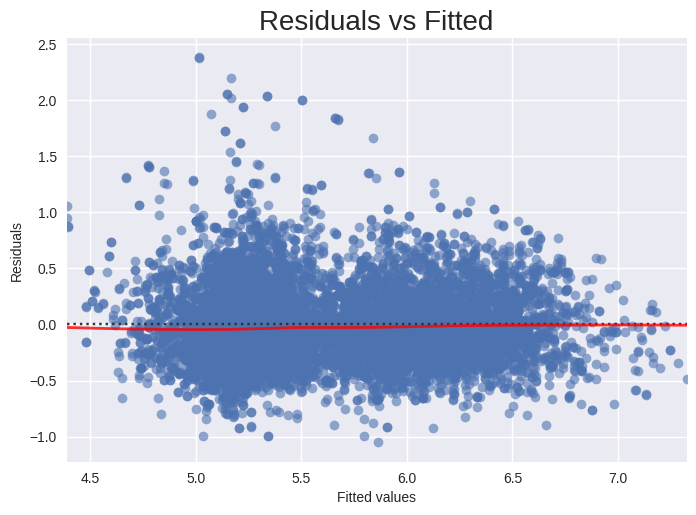

In [125]:
fig_1 = plt.figure(1)
fig_1.axes[0] = sns.residplot(data=data_model, x=data_model['yhat'], y=data_model['log_realSum'],
                                  lowess=True,
                                  scatter_kws={'alpha': 0.6},
                                  line_kws={'color': 'red', 'lw': 2, 'alpha': 0.8})
fig_1.axes[0].set_title('Residuals vs Fitted')
fig_1.axes[0].set_xlabel('Fitted values')
fig_1.axes[0].set_ylabel('Residuals')

### **3. Отсутствие автокорреляции остатков**


Критерий Дарбина - Уотсона равен 1,810, то есть стремится к 2 - автокорреляция отсутствует. Предпосылка выполняется.

### **4. Эндогенность**

Для проверки на наличие эндогенности посмотрим на корреляцию объясняющих переменных с остатками модели.

In [126]:
data[ols_6.params.index[1:].to_list()+['resid']].corr()['resid']

room_shared          -8.444531e-16
room_private         -1.003210e-14
person_capacity       8.433653e-15
host_is_superhost    -2.870008e-15
multi                -1.178608e-15
cleanliness_rating    2.663303e-15
bedrooms              2.162392e-15
metro_dist           -1.128561e-14
log_metro_dist       -1.420266e-14
attr_index_norm       2.476873e-14
rest_index_norm       2.397679e-14
resid                 1.000000e+00
Name: resid, dtype: float64

Заметим, что значение корреляции стремится к нулю для каждой переменной. Более того из графика выше (Residuals vs Fitted) видно, что в поведении остатков не наблюдается закономерностей, то есть спецификация была выбрана верно. Однако, мы можем предположить эндогенность переменной attr_index_norm в связи с ее высокой корреляцией с переменной rest_index_norm. Для проверки данной гипотезы воспользуемся двухшаговым МНК, в качестве инструментальной переменной возьмем rest_index_norm.

In [127]:
data['const'] = np.ones(len(data))

In [128]:
endog = ["attr_index_norm"]
exog = ['const', 'room_shared', 'room_private', 'person_capacity', 'host_is_superhost',
       'multi', 'bedrooms', 'metro_dist', 'log_metro_dist']
instr = ["rest_index_norm"]

In [129]:
res_iv = IV2SLS(data.log_realSum, data[exog], data[endog], data[instr]).fit(
    cov_type = "unadjusted"
)
print(res_iv)

                          IV-2SLS Estimation Summary                          
Dep. Variable:            log_realSum   R-squared:                      0.6903
Estimator:                    IV-2SLS   Adj. R-squared:                 0.6900
No. Observations:                9918   F-statistic:                 2.199e+04
Date:                Wed, May 10 2023   P-value (F-stat)                0.0000
Time:                        13:44:02   Distribution:                  chi2(9)
Cov. Estimator:            unadjusted                                         
                                                                              
                                 Parameter Estimates                                 
                   Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
-------------------------------------------------------------------------------------
const                 5.2755     0.0170     309.84     0.0000      5.2422      5.3089
room_shared          -0.

В результате построения 2-МНК модели, значение $adj. R^2$ снизилось, поэтому гипотеза не работает должным образом - модель 2-МНК не приводит к улучшению результатов, а эндогенность отстутствует.

### **5. Проверка гипотезы о нормальности случайной ошибки**

In [130]:
from scipy.stats import kstest

kstest(ols_6.resid, 'norm')

KstestResult(statistic=0.2715591035182927, pvalue=0.0, statistic_location=-0.4723381294589801, statistic_sign=-1)

In [131]:
#критическое значение
stats.norm.ppf(.975)

1.959963984540054

Поскольку z-stat < z-crit = 1.96, то нулевая гипотеза о нормальности случайной ошибки не отвергается.

<Axes: ylabel='Density'>

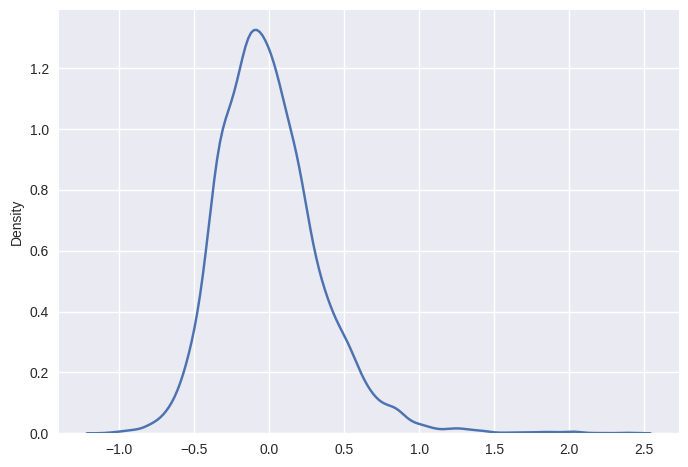

In [132]:
sns.kdeplot(ols_6.resid)

## **Мультиколлинеарность**

In [133]:
colors = sns.color_palette('RdBu', 20)

<Figure size 1500x1500 with 0 Axes>

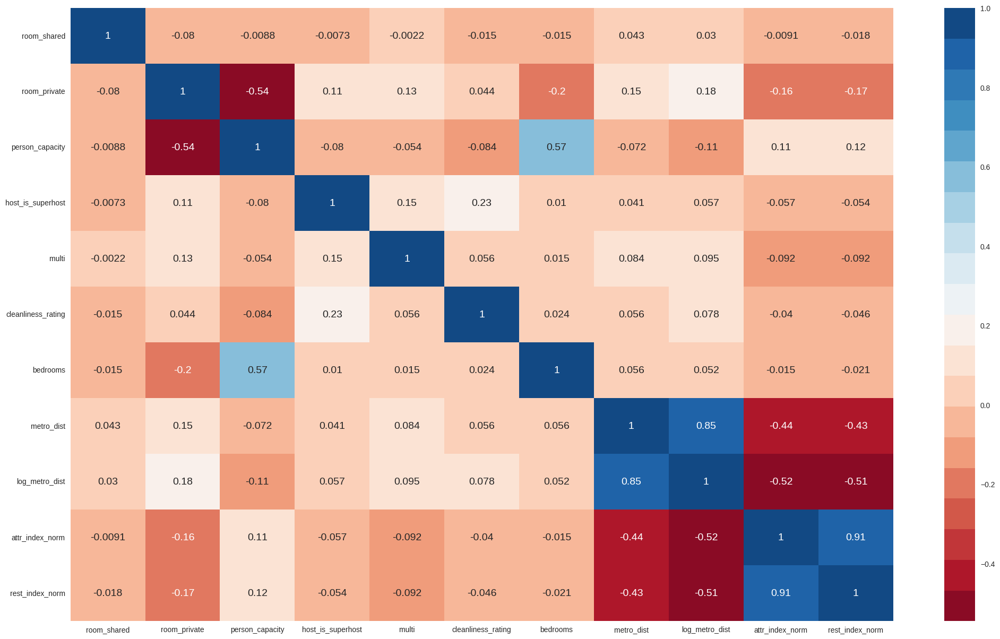

In [134]:
plt.figure(figsize=(15,15))
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(25, 15))
sns.heatmap(data[ols_6.params.index[1:].to_list()].corr(), cmap=colors, annot=True, ax=axes);

In [135]:
data.loc[:, ["room_shared", "room_private", "person_capacity", "host_is_superhost", "multi", "cleanliness_rating", "bedrooms", "metro_dist", "log_metro_dist", "attr_index_norm", "rest_index_norm"]].corr() #корреляционная матрица


,room_shared,room_private,person_capacity,host_is_superhost,multi,cleanliness_rating,bedrooms,metro_dist,log_metro_dist,attr_index_norm,rest_index_norm
room_shared,1.000000,-0.080188,-0.008829,-0.007291,-0.002194,-0.015487,-0.015070,0.043381,0.030413,-0.009063,-0.018407
room_private,-0.080188,1.000000,-0.544955,0.105156,0.133243,0.044229,-0.198562,0.149133,0.184719,-0.164519,-0.174100
person_capacity,-0.008829,-0.544955,1.000000,-0.080220,-0.053674,-0.084207,0.567491,-0.072375,-0.108420,0.109889,0.119346
host_is_superhost,-0.007291,0.105156,-0.080220,1.000000,0.148420,0.225779,0.010153,0.040805,0.057094,-0.057383,-0.054000
multi,-0.002194,0.133243,-0.053674,0.148420,1.000000,0.056051,0.014928,0.084429,0.095280,-0.092148,-0.092497
cleanliness_rating,-0.015487,0.044229,-0.084207,0.225779,0.056051,1.000000,0.023756,0.055573,0.077754,-0.039980,-0.046263
bedrooms,-0.015070,-0.198562,0.567491,0.010153,0.014928,0.023756,1.000000,0.055782,0.051629,-0.015341,-0.021393
metro_dist,0.043381,0.149133,-0.072375,0.040805,0.084429,0.055573,0.055782,1.000000,0.846936,-0.440763,-0.426103
log_metro_dist,0.030413,0.184719,-0.108420,0.057094,0.095280,0.077754,0.051629,0.846936,1.000000,-0.517370,-0.514290
attr_index_norm,-0.009063,-0.164519,0.109889,-0.057383,-0.092148,-0.039980,-0.015341,-0.440763,-0.517370,1.000000,0.906228


In [136]:
variables = ols_6.model.exog
var_names = ols_6.model.exog_names

# Рассчитаем VIF с помощью команды vif()

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["Variable"]   = var_names[1:]
vif["VIF Factor"] = [variance_inflation_factor(variables, i) for i in range(1, variables.shape[1])]
print(vif)

              Variable  VIF Factor
0          room_shared    1.014875
1         room_private    1.530127
2      person_capacity    2.116844
3    host_is_superhost    1.084089
4                multi    1.045532
5   cleanliness_rating    1.069967
6             bedrooms    1.550524
7           metro_dist    3.557920
8       log_metro_dist    3.990044
9      attr_index_norm    5.732216
10     rest_index_norm    5.726649


Так как VIF для каждой переменной меньше 10, проблема мультиколлинеарности отсутствует

## Прогноз стоимости проживания для двух человек за две ночи

**Первый номер**: хостел на двоих с двуспальной кроватью. В хостеле посредственная уборка, находится на окраине города, но рядом с метро. Жилье находится далеко от ресторанов и достопримечательностей.

In [137]:
example_data = pd.DataFrame([{'room_shared': 1, 'room_private': 0, 'person_capacity': 2, 'host_is_superhost': 0, 'multi': 1, 'cleanliness_rating': 3, 'bedrooms': 1, 'metro_dist': 0.2, 'log_metro_dist': -1.609, 'attr_index_norm': 6, 'rest_index_norm': 6}])

price = ols_6.predict(example_data)
print(f'Предсказанная стоимость проживания: {np.exp(price[0]).round(0)} евро')

Предсказанная стоимость проживания: 118.0 евро


**Второй номер**: апартаменты на двоих, владелец является суперхозяином, отличная уборка, рядом много ресторанов и ддостопримечательностей. Номер расположен близко к центру, но подальше от метро.

In [138]:
example_data = pd.DataFrame([{'room_shared': 0, 'room_private': 0, 'person_capacity': 2, 'host_is_superhost': 1, 'multi': 0, 'cleanliness_rating': 9, 'bedrooms': 2, 'metro_dist': 0.3, 'log_metro_dist': -1.204, 'attr_index_norm': 25, 'rest_index_norm': 25}])

price = ols_6.predict(example_data)
print(f'Предсказанная стоимость проживания: {np.exp(price[0]).round(0)} евро')

Предсказанная стоимость проживания: 522.0 евро


## Квантильная регрессия для конечной спецификации

In [139]:
import statsmodels.formula.api as smf

### 10% перцентиль

In [140]:
quantreg10 = smf.quantreg('log_realSum ~ room_shared + room_private + person_capacity + host_is_superhost + multi + cleanliness_rating + bedrooms + log_metro_dist + attr_index_norm + rest_index_norm + metro_dist', data).fit(q = 0.1)
quantreg10.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                         QuantReg Regression Results                          
==============================================================================
Dep. Variable:            log_realSum   Pseudo R-squared:               0.4645
Model:                       QuantReg   Bandwidth:                     0.05715
Method:                 Least Squares   Sparsity:                        1.239
Date:                Wed, 10 May 2023   No. Observations:                 9918
Time:                        13:44:05   Df Residuals:                     9906
                                        Df Model:                           11
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              4.5300      0.032    141.970      0.000       4.467       4.593
room_shared           -0.8258      0.053    -15.528      0.000      -0.930      -0.722
room_private          -0.6595      0.009    -69.972      0.000      -0.678      -0.641
person_capacity        0.1050      0.005     21.409      0.000       0.095       0.115
host_is_superhost      0.0657      0.011      6.109      0.000       0.045       0.087
multi                 -0.0157      0.009     -1.810      0.070      -0.033       0.001
cleanliness_rating     0.0484      0.003     18.127      0.000       0.043       0.054
bedrooms               0.1383      0.010     13.742      0.000       0.119       0.158
log_metro_dist        -0.0095      0.008     -1.227      0.220      -0.025       0.006
attr_index_norm        0.0081      0.001      7.514      0.000       0.006       0.010
rest_index_norm        0.0071      0.002      3.596      0.000       0.003       0.011
metro_dist            -0.0646      0.005    -11.949      0.000      -0.075      -0.054
======================================================================================
"""

Уберем незначимые признаки. 

In [141]:
quantreg10_2 = smf.quantreg('log_realSum ~ room_shared + room_private + person_capacity + host_is_superhost + cleanliness_rating + bedrooms + attr_index_norm + rest_index_norm + metro_dist', data).fit(q = 0.1)
quantreg10_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                         QuantReg Regression Results                          
==============================================================================
Dep. Variable:            log_realSum   Pseudo R-squared:               0.4643
Model:                       QuantReg   Bandwidth:                     0.05685
Method:                 Least Squares   Sparsity:                        1.227
Date:                Wed, 10 May 2023   No. Observations:                 9918
Time:                        13:44:05   Df Residuals:                     9908
                                        Df Model:                            9
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              4.5245      0.031    144.085      0.000       4.463       4.586
room_shared           -0.8239      0.053    -15.645      0.000      -0.927      -0.721
room_private          -0.6544      0.009    -70.882      0.000      -0.672      -0.636
person_capacity        0.1074      0.005     22.154      0.000       0.098       0.117
host_is_superhost      0.0673      0.011      6.401      0.000       0.047       0.088
cleanliness_rating     0.0490      0.003     18.436      0.000       0.044       0.054
bedrooms               0.1322      0.010     13.221      0.000       0.113       0.152
attr_index_norm        0.0082      0.001      7.709      0.000       0.006       0.010
rest_index_norm        0.0071      0.002      3.678      0.000       0.003       0.011
metro_dist            -0.0696      0.003    -21.558      0.000      -0.076      -0.063
======================================================================================
"""

### 90% перцентиль

In [142]:
quantreg90 = smf.quantreg('log_realSum ~ room_shared + room_private + person_capacity + host_is_superhost + multi + cleanliness_rating + bedrooms + log_metro_dist + attr_index_norm + rest_index_norm + metro_dist', data).fit(q = 0.9)
quantreg90.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                         QuantReg Regression Results                          
==============================================================================
Dep. Variable:            log_realSum   Pseudo R-squared:               0.4101
Model:                       QuantReg   Bandwidth:                     0.05882
Method:                 Least Squares   Sparsity:                        2.392
Date:                Wed, 10 May 2023   No. Observations:                 9918
Time:                        13:44:05   Df Residuals:                     9906
                                        Df Model:                           11
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              5.2343      0.085     61.649      0.000       5.068       5.401
room_shared           -0.6261      0.103     -6.099      0.000      -0.827      -0.425
room_private          -0.5446      0.019    -28.181      0.000      -0.582      -0.507
person_capacity        0.0998      0.009     11.451      0.000       0.083       0.117
host_is_superhost     -0.0300      0.021     -1.412      0.158      -0.072       0.012
multi                  0.0477      0.016      2.894      0.004       0.015       0.080
cleanliness_rating     0.0368      0.008      4.420      0.000       0.020       0.053
bedrooms               0.2271      0.016     14.026      0.000       0.195       0.259
log_metro_dist        -0.0341      0.015     -2.329      0.020      -0.063      -0.005
attr_index_norm        0.0114      0.001      8.592      0.000       0.009       0.014
rest_index_norm        0.0038      0.002      1.914      0.056   -9.27e-05       0.008
metro_dist            -0.0520      0.012     -4.443      0.000      -0.075      -0.029
======================================================================================
"""

Уберем незначимые признаки. 

In [143]:
quantreg90_2 = smf.quantreg('log_realSum ~ room_shared + room_private + person_capacity + multi + cleanliness_rating + bedrooms + log_metro_dist + attr_index_norm + metro_dist', data).fit(q = 0.9)
quantreg90_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                         QuantReg Regression Results                          
==============================================================================
Dep. Variable:            log_realSum   Pseudo R-squared:               0.4098
Model:                       QuantReg   Bandwidth:                     0.05892
Method:                 Least Squares   Sparsity:                        2.317
Date:                Wed, 10 May 2023   No. Observations:                 9918
Time:                        13:44:05   Df Residuals:                     9908
                                        Df Model:                            9
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              5.2435      0.081     64.852      0.000       5.085       5.402
room_shared           -0.6370      0.099     -6.408      0.000      -0.832      -0.442
room_private          -0.5459      0.019    -29.153      0.000      -0.583      -0.509
person_capacity        0.1013      0.009     11.918      0.000       0.085       0.118
multi                  0.0418      0.016      2.631      0.009       0.011       0.073
cleanliness_rating     0.0351      0.008      4.508      0.000       0.020       0.050
bedrooms               0.2262      0.016     14.403      0.000       0.195       0.257
log_metro_dist        -0.0418      0.014     -2.953      0.003      -0.070      -0.014
attr_index_norm        0.0130      0.001     21.650      0.000       0.012       0.014
metro_dist            -0.0477      0.011     -4.230      0.000      -0.070      -0.026
======================================================================================
"""

## Построим квантильные регрессии от 5% до 95% с шагом 10% для анализа изменения знака и модуля коэффициентов регрессии.

In [144]:
model = smf.quantreg("log_realSum ~ room_shared + room_private + person_capacity + host_is_superhost + multi + cleanliness_rating + bedrooms + log_metro_dist + attr_index_norm + rest_index_norm + metro_dist", data)

In [169]:
quantiles = np.arange(0.05, 0.96, 0.1)


def fit_model(q):
    res = model.fit(q=q)
    return [q, res.params["Intercept"], res.params["room_shared"], res.params["room_private"], res.params["person_capacity"], res.params["host_is_superhost"], res.params["multi"], res.params["cleanliness_rating"],
            res.params["bedrooms"], res.params["log_metro_dist"],res.params["attr_index_norm"], res.params["rest_index_norm"], res.params["metro_dist"]] + res.conf_int().loc["host_is_superhost"].tolist() + res.conf_int().loc["bedrooms"].tolist()


models = [fit_model(x) for x in quantiles]
models = pd.DataFrame(models, columns=["q", "intercept", "room_shared", "room_private", "person_capacity", "host_is_superhost", "multi", "cleanliness_rating", "bedrooms",
                                       "log_metro_dist", "attr_index_norm", "rest_index_norm", "metro_dist", "super_lb", "super_ub", "bed_lb", "bed_ub"])

ols = smf.ols("log_realSum ~ room_shared + room_private + person_capacity + host_is_superhost + multi + cleanliness_rating + bedrooms + log_metro_dist + attr_index_norm + rest_index_norm + metro_dist", data).fit()
ols_ci_1 = ols.conf_int().loc["host_is_superhost"].tolist()
ols_ci_2 = ols.conf_int().loc["bedrooms"].tolist()
ols = dict(
    Intercept=ols.params["Intercept"], room_shared=ols.params["room_shared"], room_private=ols.params["room_private"], person_capacity=ols.params["person_capacity"], host_is_superhost=ols.params["host_is_superhost"],
    multi=ols.params["multi"], cleanliness_rating=ols.params["cleanliness_rating"], bedrooms=ols.params["bedrooms"], log_metro_dist=ols.params["log_metro_dist"], 
    attr_index_norm=ols.params["attr_index_norm"], rest_index_norm=ols.params["rest_index_norm"], metro_dist=ols.params["metro_dist"], super_lb=ols_ci_1[0], super_ub=ols_ci_1[1], bed_lb=ols_ci_2[0], bed_ub=ols_ci_2[1]
)

print(models)
print(ols)

      q  intercept  room_shared  room_private  person_capacity  \
0  0.05   4.440736    -1.135755     -0.670694         0.105133   
1  0.15   4.559568    -0.801110     -0.671168         0.102139   
2  0.25   4.690894    -0.839347     -0.686712         0.097806   
3  0.35   4.783101    -0.890993     -0.695505         0.093192   
4  0.45   4.855643    -0.766529     -0.695363         0.092585   
5  0.55   4.947076    -0.758952     -0.689581         0.087232   
6  0.65   5.036169    -0.726011     -0.658204         0.088000   
7  0.75   5.073814    -0.726672     -0.628340         0.089564   
8  0.85   5.139556    -0.592565     -0.572942         0.100220   
9  0.95   5.590036    -0.676365     -0.515934         0.092096   

   host_is_superhost     multi  cleanliness_rating  bedrooms  log_metro_dist  \
0           0.088728 -0.016197            0.051100  0.114889       -0.005498   
1           0.065231 -0.006564            0.049722  0.142705       -0.019317   
2           0.076203 -0.002903   

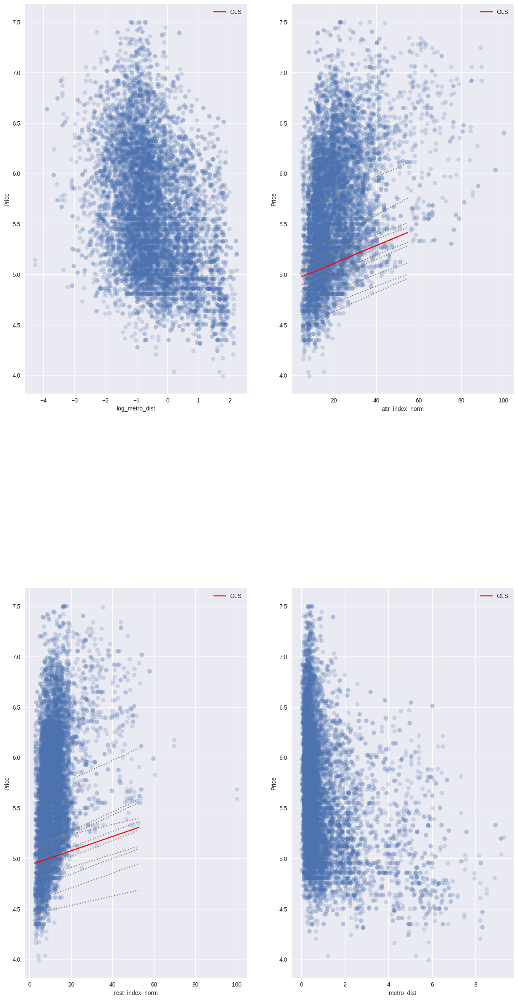

In [165]:
features = ["log_metro_dist", "attr_index_norm", "rest_index_norm", "metro_dist"]
def plotter_5(feature,color,x,y):

    X = np.arange(data[feature].min(), data[feature].max(), 50)
    get_y = lambda a, b: a + b * X

    for n in range(models.shape[0]):
        Y = get_y(models.intercept[n], models[feature][n])
        axes[x,y].plot(X, Y, linestyle="dotted", color="grey")

    Y = get_y(ols["Intercept"], ols[feature])

    axes[x,y].plot(X, Y, color="red", label="OLS")
    axes[x,y].scatter(data[feature], data.log_realSum, alpha=0.2)
    legend = axes[x,y].legend()
    axes[x,y].set_ylabel("Price")
    axes[x,y].set_xlabel(feature)

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 30))
x = 0
y = 0
for i in range(4):
    plotter_5(features[i] , '#8d7dca', x, y)
    y  = y + 1
    if y == 2:
        x = x + 1
        y = 0

plt.subplots_adjust(hspace=0.5)

## Графики изменения коэффициентов в зависимости от квантиля

Для host_is_superhost

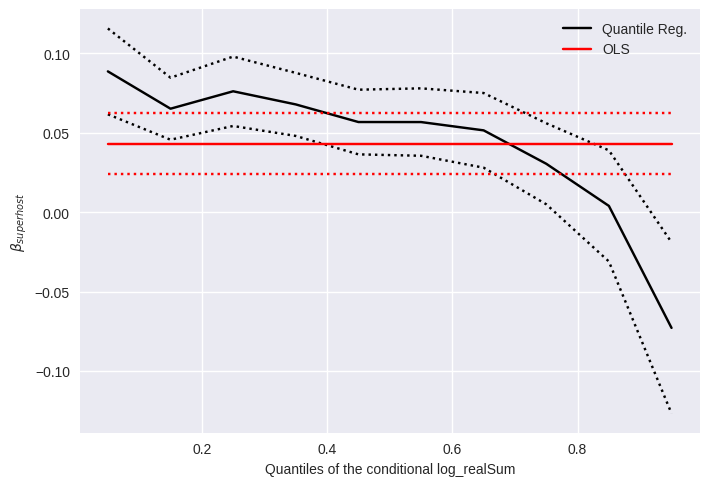

In [168]:
n = models.shape[0]
p1 = plt.plot(models.q, models.host_is_superhost, color="black", label="Quantile Reg.")
p2 = plt.plot(models.q, models.super_ub, linestyle="dotted", color="black")
p3 = plt.plot(models.q, models.super_lb, linestyle="dotted", color="black")
p4 = plt.plot(models.q, [ols["host_is_superhost"]] * n, color="red", label="OLS")
p5 = plt.plot(models.q, [ols["super_lb"]] * n, linestyle="dotted", color="red")
p6 = plt.plot(models.q, [ols["super_ub"]] * n, linestyle="dotted", color="red")
plt.ylabel(r"$\beta_{superhost}$")
plt.xlabel("Quantiles of the conditional log_realSum")
plt.legend()
plt.show()

Заметим, что при увеличении квантиля коэффициент при host_is_superhost снижается и даже меняет знак для квантиля 0.95. Это говорит о том, что в более дешевых квартирах наличие супер-хозяина положительно сказывается на цене жилья, в самых дорогих квартирах наличие супер-хозяина наоборот снижает цену. Скорее всего это связано с тем, что до 95% квантиля влияние на цену придерживается стандартной логике: если жилье предоставляет супер-хозяин, то это метка качества, надежности и доверия, что увеличивает цену, обычно это имеется у сети отелей и гостиниц. В случае самых дорогих квартир наоборот: самые люксовые апартаменты сдаются редко частными владельцами, которые не имеют статуса супер-хозяина. В данной ценовой категории, но все же более дешевое жилье предоставляется брендовыми сетями пятизвездочных отелей, которые имеют статус супер-хозяина.

Для bedrooms

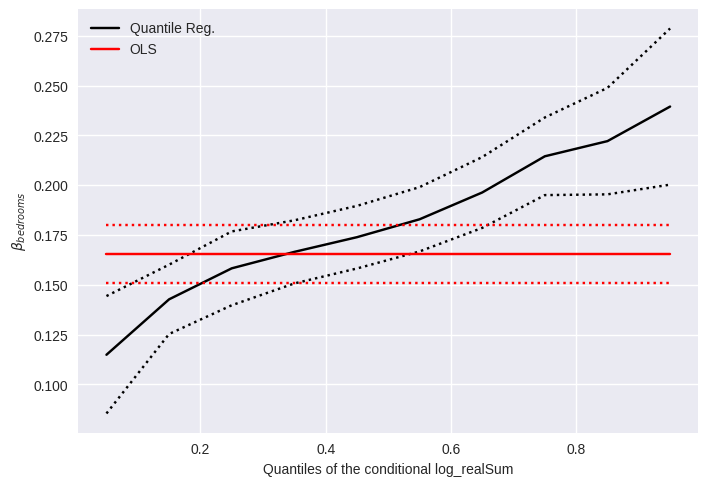

In [170]:
n = models.shape[0]
p1 = plt.plot(models.q, models.bedrooms, color="black", label="Quantile Reg.")
p2 = plt.plot(models.q, models.bed_ub, linestyle="dotted", color="black")
p3 = plt.plot(models.q, models.bed_lb, linestyle="dotted", color="black")
p4 = plt.plot(models.q, [ols["bedrooms"]] * n, color="red", label="OLS")
p5 = plt.plot(models.q, [ols["bed_lb"]] * n, linestyle="dotted", color="red")
p6 = plt.plot(models.q, [ols["bed_ub"]] * n, linestyle="dotted", color="red")
plt.ylabel(r"$\beta_{bedrooms}$")
plt.xlabel("Quantiles of the conditional log_realSum")
plt.legend()
plt.show()

При увеличении квантиля коэффициент при bedrooms растет с 0.115 до 0.24, то есть каждая дополнительня спальня в 5% процентах самых дешевых квартир увеличивает их стоимость на 11.5%, однако каждая дополнительня спальня в 5% процентах самых дорогих квартир увеличивает их стоимость на 24%.

**Предпосылка:** в выборке 10% самых дешевых квартир вряд ли окажется суперхозяин так же, как в выборке 10% самых дорогих квартир скорее всего будут все суперхозяева. Из-за этого баланс классов отсутствует, и коэффициент оказывается незначимым.

**Итог:** действительно, host_is_superhost в 90% квантильной регрессии оказался незначим на уровне значимости 5%. Однако, в 10% регрессии данный коэффициент значим, скорее всего это связано с тем, что среди владельцев дешевого жилья есть сети хостелов или бюджетных гостиниц, которые имеют статус суперхозяев. Этот факт делает классы суперхозяев и обычных хозяев сбалансированными, а, следовательно, коэффициент при host_is_superhost остается значимым.

**Предпосылка:** в 10% самых дешевых квартирах индекс чистоты будет иметь большую величину, чем в дорогих квартирах, поскольку дорогие квартиры априори должны отвечать критерию чистоты, что снижает влиятельность данного фактора на стоимость дорогих квартир.
Итог: гипотеза оказалась верной и была подтверждена полученными результатами. Так, в 10%-перцентильной регрессии у параметра cleanliness_rating коэффициент равен 0.0490, а в 90%-перцентильной регрессии 0.0351.

**Вывод:** таким образом, функциональные формы для разных квантилей и вправду отличаются: при каждом факторе поменялись величины коэффициентов, а некоторые регрессоры сохранились только в одной из моделей: host_is_superhost и rest_index_norm (аналогично cleanliness_rating – дорогие квартиры априори должны отвечать критерию хорошего окружения ресторанами) остались только в 10%-перцентильной регрессии, а multi (данный фактор является знаком качества, а при оплате дорогой аренды потребитель больше задумывается о возможном исходе обмана и о надежности хозяина, поэтому косвенный признак доверия в дорогих квартирах более значим) и log_metro_dist - только в 90%-перцентильной регрессии.

# Заключение

В итоге получили модель гедонистической ценовой функции для рынка недвижимости в Лондоне на онлайн-площадке Airbnb. Построенная модель отвечает всем предпосылкам Гаусса-Маркова, значит, оценки метода наименьших квадратов оптимальны в классе линейных несмещённых оценок. 

Исходя из полученных оценок коэффициентов можно сделать следующие выводы:

•	На первом месте по значимости в оценку стоимости букинга стоит тип жилья: room_shared вносит наибольший вклад в стоимость: в случае если жилье типа хостел, то это уменьшает цену на 77,08% (поскольку за базовую категорию по этому параметру мы берем апартаменты); room_private вносит второй по значимости вклад в стоимость: в случае если жилье типа комнаты, то это уменьшает цену на 64,03% (поскольку за базовую категорию по этому параметру мы берем апартаменты)

•	На втором месте – количество спален: bedrooms вносит третий по значимости вклад в стоимость: при увеличении параметра на 1 единицу стоимость увеличивается на 16,53%

•	На третьем месте – количество вмещаемых человек: person_capasity вносит четвертый по значимости вклад в стоимость: при увеличении параметра на 1 единицу стоимость увеличивается на 10,16%

Данные результаты соответствуют действительности, что подтверждает правильность выбора функциональной формы построенной конечной модели. 
